In [29]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [30]:
import numpy as np
from scipy.signal import gausspulse
import matplotlib.pyplot as plt
import joblib
import optuna
from pathlib import Path
from sklearn.metrics import mean_squared_error

from filter_tc.sensitivity_analysis.data_generation import *
from filter_tc.particle_filter import ParticleFilter
from filter_tc.utils import learn_alpha

In [31]:
loading = 'compression'

In [33]:
loaded_studies = {}
studies_directory = Path('studies/200tries/'+loading)
for filepath in studies_directory.iterdir():
    if filepath.is_file():
        key_str = str(filepath).split('/')[-1].split('(')[1].split(')')[0]
        key = (float(key_str.split(',')[0]), float(key_str.split(',')[1]), float(key_str.split(',')[2]))
        loaded_studies[key] = joblib.load(filepath)

In [34]:
# create datasets
key_list = list(loaded_studies.keys())

event_to_trend_amplitudes = np.unique(np.array([t[0] for t in key_list])) #np.arange(0.1, 0.7, 0.1)
event_length_to_trend_periods = np.unique(np.array([t[1] for t in key_list])) #np.arange(0.1, 0.7, 0.1)
time_shifts = np.unique(np.array([t[2] for t in key_list])) #np.arange(0.005, 0.025, 0.005)

amplitude_shift = 0.5

datasets = create_datasets(
    event_to_trend_amplitudes,
    event_length_to_trend_periods,
    time_shifts,
    amplitude_shift,
    loading=loading
)

In [35]:
max_allowed_timeshift = 0.005
min_allowed_event_to_trend_amplitude = 0.1
max_allowed_event_length_to_trend_period = 0.5

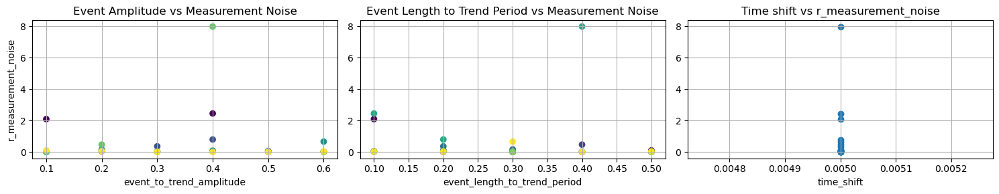

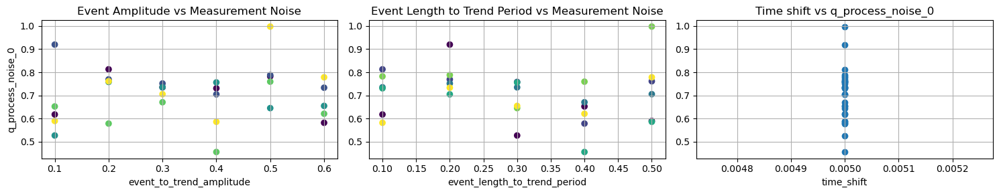

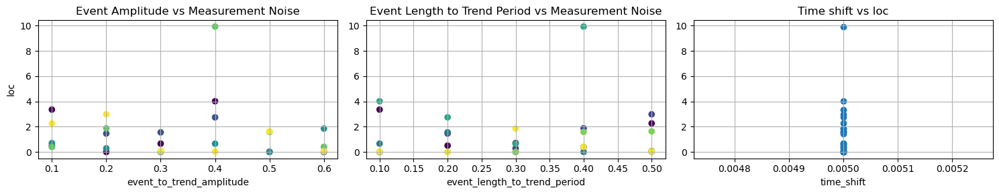

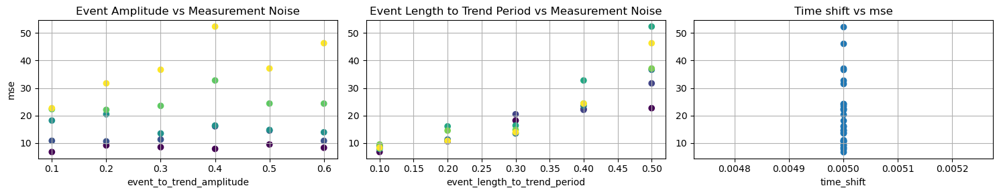

In [36]:
import pandas as pd
parameters = pd.DataFrame(index=[i for i in range(len(list(loaded_studies.keys())))],
                          columns=['event_to_trend_amplitude', 'event_length_to_trend_period', 'time_shift', 'r_measurement_noise', 'q_process_noise_0', 'loc', 'mse'])
i = 0
for key in loaded_studies.keys():
    if key[0] >= min_allowed_event_to_trend_amplitude and key[1] <= max_allowed_event_length_to_trend_period and key[2] <= max_allowed_timeshift:
        parameters['event_to_trend_amplitude'][i] = key[0]
        parameters['event_length_to_trend_period'][i] = key[1]
        parameters['time_shift'][i] = key[2]
        #parameters['num_particles'][i] = best_params[key]['num_particles']
        parameters['r_measurement_noise'][i] = loaded_studies[key].best_trial.params['r_measurement_noise']
        parameters['q_process_noise_0'][i] = loaded_studies[key].best_trial.params['q_process_noise_0']
        parameters['loc'][i] = loaded_studies[key].best_trial.params['loc']
        parameters['mse'][i] = loaded_studies[key].best_trial.values[0]
        i += 1
parameters = parameters.dropna()

# Create a figure and a set of subplots
y_param = 'r_measurement_noise'
fig, axs = plt.subplots(1, 3, figsize=(15, 3))  # 1 row, 2 columns, optional figure size
# First subplot
axs[0].scatter(parameters['event_to_trend_amplitude'], parameters[y_param], 
               marker='o', c=parameters['event_length_to_trend_period'])
axs[0].set_xlabel('event_to_trend_amplitude')
axs[0].set_ylabel(y_param)
axs[0].set_title('Event Amplitude vs Measurement Noise')
axs[0].grid()
# Second subplot
axs[1].scatter(parameters['event_length_to_trend_period'], parameters[y_param], 
               marker='o', c=parameters['event_to_trend_amplitude'])
axs[1].set_xlabel('event_length_to_trend_period')
axs[1].set_title('Event Length to Trend Period vs Measurement Noise')
axs[1].grid()
# Third subplot
axs[2].scatter(parameters['time_shift'], parameters[y_param], 
               marker='o')
axs[2].set_xlabel('time_shift')
axs[2].set_title('Time shift vs '+ y_param)
axs[2].grid()
# Display the figure
plt.tight_layout()  # Adjusts the subplots to fit into the figure area
plt.show()

# Create a figure and a set of subplots
y_param = 'q_process_noise_0'
fig, axs = plt.subplots(1, 3, figsize=(15, 3))  # 1 row, 2 columns, optional figure size
# First subplot
axs[0].scatter(parameters['event_to_trend_amplitude'], parameters[y_param], 
               marker='o', c=parameters['event_length_to_trend_period'])
axs[0].set_xlabel('event_to_trend_amplitude')
axs[0].set_ylabel(y_param)
axs[0].set_title('Event Amplitude vs Measurement Noise')
axs[0].grid()
# Second subplot
axs[1].scatter(parameters['event_length_to_trend_period'], parameters[y_param], 
               marker='o', c=parameters['event_to_trend_amplitude'])
axs[1].set_xlabel('event_length_to_trend_period')
axs[1].set_title('Event Length to Trend Period vs Measurement Noise')
axs[1].grid()
# Third subplot
axs[2].scatter(parameters['time_shift'], parameters[y_param], 
               marker='o')
axs[2].set_xlabel('time_shift')
axs[2].set_title('Time shift vs '+ y_param)
axs[2].grid()
# Display the figure
plt.tight_layout()  # Adjusts the subplots to fit into the figure area
plt.show()

# Create a figure and a set of subplots
y_param = 'loc'
fig, axs = plt.subplots(1, 3, figsize=(15, 3))  # 1 row, 2 columns, optional figure size
# First subplot
axs[0].scatter(parameters['event_to_trend_amplitude'], parameters[y_param], 
               marker='o', c=parameters['event_length_to_trend_period'])
axs[0].set_xlabel('event_to_trend_amplitude')
axs[0].set_ylabel(y_param)
axs[0].set_title('Event Amplitude vs Measurement Noise')
axs[0].grid()
# Second subplot
axs[1].scatter(parameters['event_length_to_trend_period'], parameters[y_param], 
               marker='o', c=parameters['event_to_trend_amplitude'])
axs[1].set_xlabel('event_length_to_trend_period')
axs[1].set_title('Event Length to Trend Period vs Measurement Noise')
axs[1].grid()
# Third subplot
axs[2].scatter(parameters['time_shift'], parameters[y_param], 
               marker='o')
axs[2].set_xlabel('time_shift')
axs[2].set_title('Time shift vs '+y_param)
axs[2].grid()
# Display the figure
plt.tight_layout()  # Adjusts the subplots to fit into the figure area
plt.show()

# Create a figure and a set of subplots
y_param = 'mse'
fig, axs = plt.subplots(1, 3, figsize=(15, 3))  # 1 row, 2 columns, optional figure size
# First subplot
axs[0].scatter(parameters['event_to_trend_amplitude'], parameters[y_param], 
               marker='o', c=parameters['event_length_to_trend_period'])
axs[0].set_xlabel('event_to_trend_amplitude')
axs[0].set_ylabel(y_param)
axs[0].set_title('Event Amplitude vs Measurement Noise')
axs[0].grid()
# Second subplot
axs[1].scatter(parameters['event_length_to_trend_period'], parameters[y_param], 
               marker='o', c=parameters['event_to_trend_amplitude'])
axs[1].set_xlabel('event_length_to_trend_period')
axs[1].set_title('Event Length to Trend Period vs Measurement Noise')
axs[1].grid()
# Third subplot
axs[2].scatter(parameters['time_shift'], parameters[y_param], 
               marker='o')
axs[2].set_xlabel('time_shift')
axs[2].set_title('Time shift vs '+ y_param)
axs[2].grid()
# Display the figure
plt.tight_layout()  # Adjusts the subplots to fit into the figure area
plt.show()

In [37]:
parameters

,event_to_trend_amplitude,event_length_to_trend_period,time_shift,r_measurement_noise,q_process_noise_0,loc,mse
0,0.1,0.1,0.005,2.094573,0.617498,3.354263,6.680636
1,0.1,0.2,0.005,0.010178,0.919818,0.507722,10.768671
2,0.1,0.3,0.005,0.001389,0.526627,0.704309,18.146204
3,0.1,0.4,0.005,0.002107,0.65223,0.395031,22.286671
4,0.1,0.5,0.005,0.100403,0.589511,2.265565,22.643588
5,0.2,0.1,0.005,0.050798,0.812841,0.001623,9.086642
6,0.2,0.2,0.005,0.112867,0.769188,1.461694,10.55454
7,0.2,0.3,0.005,0.160214,0.758265,0.290359,20.42794
8,0.2,0.4,0.005,0.47074,0.578158,1.874742,22.039827
9,0.2,0.5,0.005,0.058737,0.761226,2.984378,31.686767


event_to_trend_amplitude: 0.1 , event_length_to_trend_period: 0.1 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 2.094572813671195, 'q_process_noise_0': 0.6174981020049883, 'loc': 3.3542628631060727}
mse: 7.9866430166775215


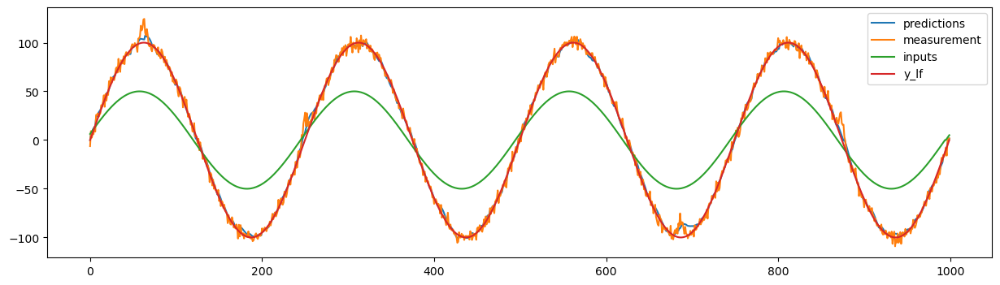

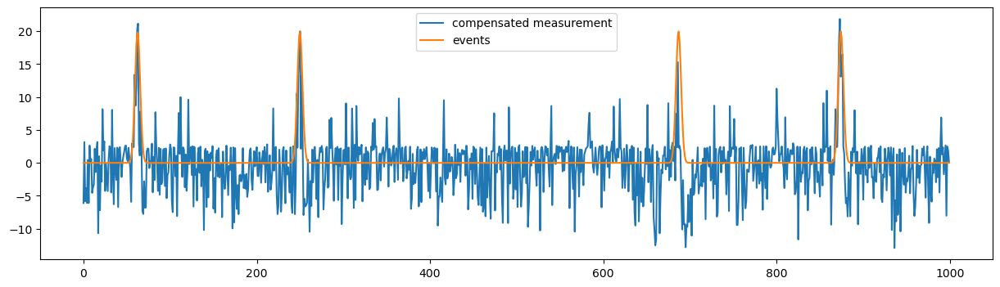

event_to_trend_amplitude: 0.1 , event_length_to_trend_period: 0.2 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.010178472438621761, 'q_process_noise_0': 0.9198177180683554, 'loc': 0.5077221592888737}
mse: 20.465902757207164


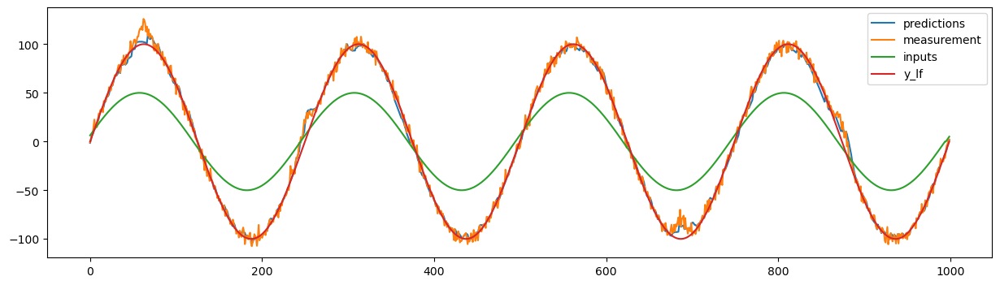

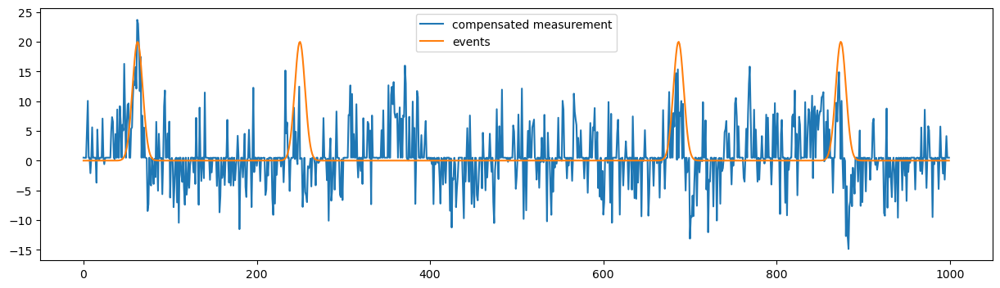

event_to_trend_amplitude: 0.1 , event_length_to_trend_period: 0.30000000000000004 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.001389425303506905, 'q_process_noise_0': 0.5266267763791975, 'loc': 0.7043089804194981}
mse: 82.0445963644727


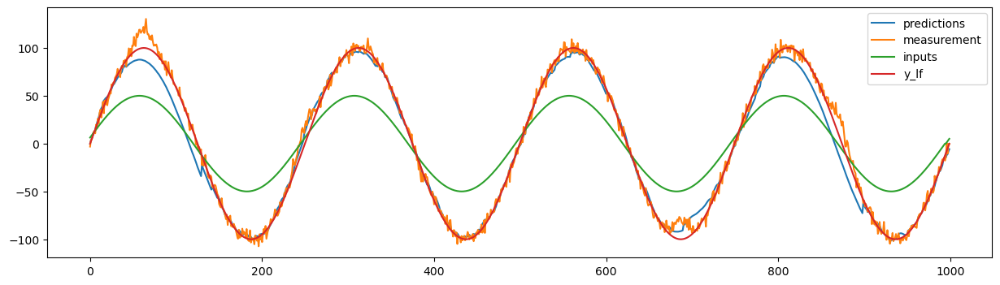

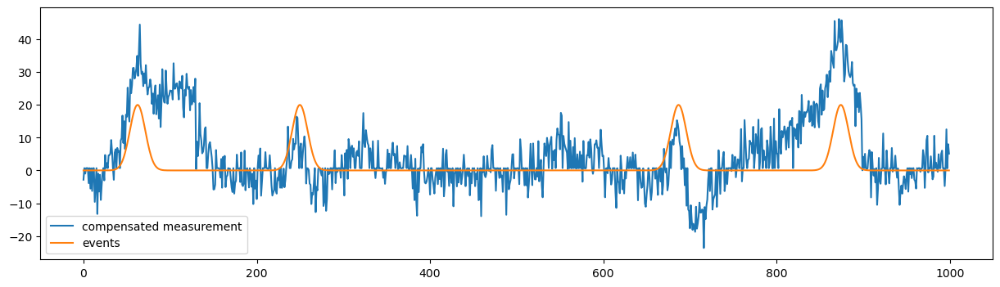

event_to_trend_amplitude: 0.1 , event_length_to_trend_period: 0.4 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.0021073127917757267, 'q_process_noise_0': 0.6522297851721249, 'loc': 0.3950313546977383}
mse: 26.831309126943605


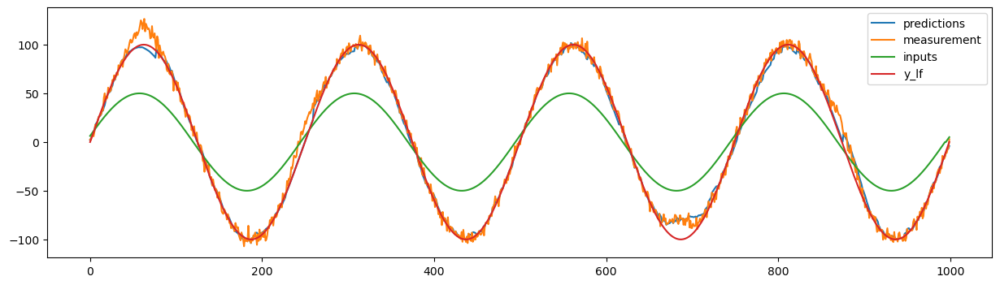

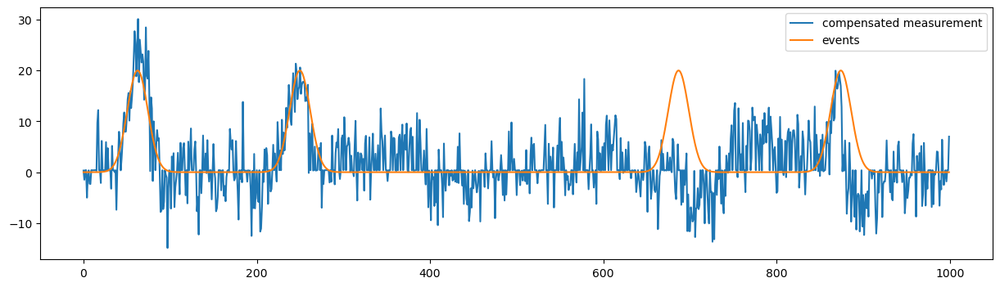

event_to_trend_amplitude: 0.1 , event_length_to_trend_period: 0.5 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.1004029056612093, 'q_process_noise_0': 0.5895109554833241, 'loc': 2.265564789821639}
mse: 33.01521135289129


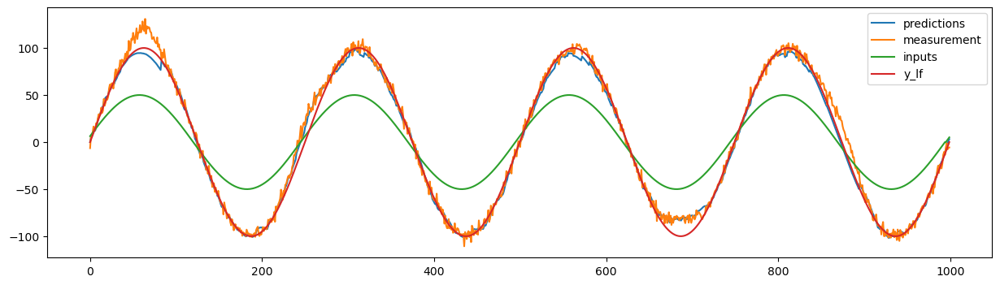

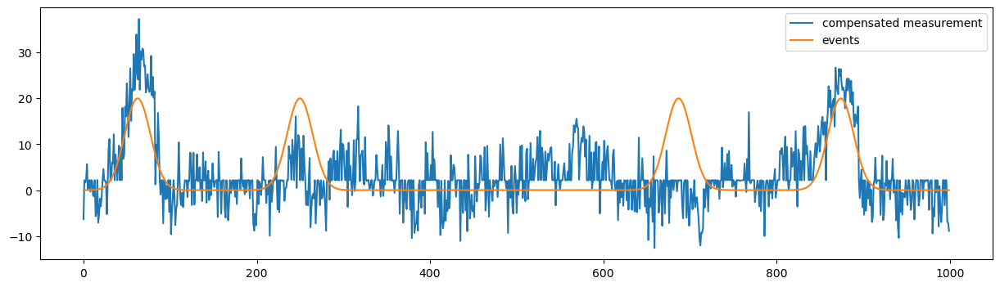

event_to_trend_amplitude: 0.2 , event_length_to_trend_period: 0.1 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.050798426524487864, 'q_process_noise_0': 0.8128414571372573, 'loc': 0.0016233700836324621}
mse: 8.612979087064788


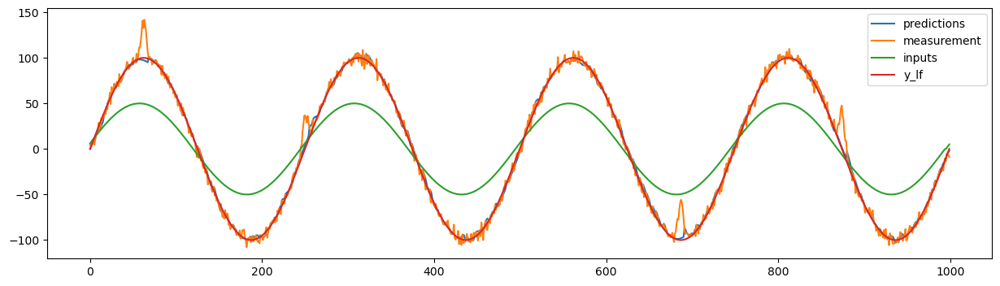

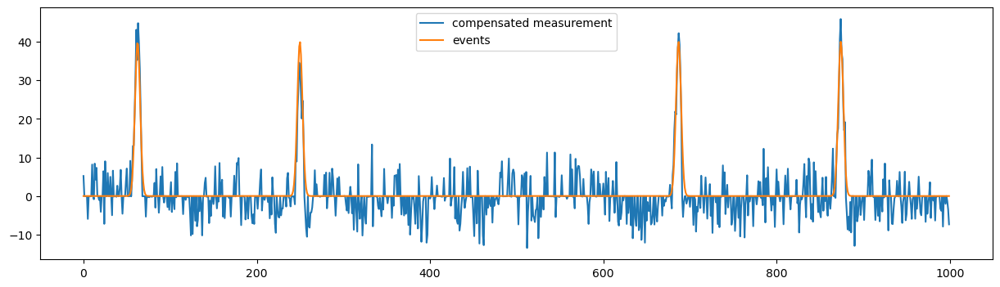

event_to_trend_amplitude: 0.2 , event_length_to_trend_period: 0.2 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.11286655414725297, 'q_process_noise_0': 0.7691877343847088, 'loc': 1.4616940538642444}
mse: 19.172402665429253


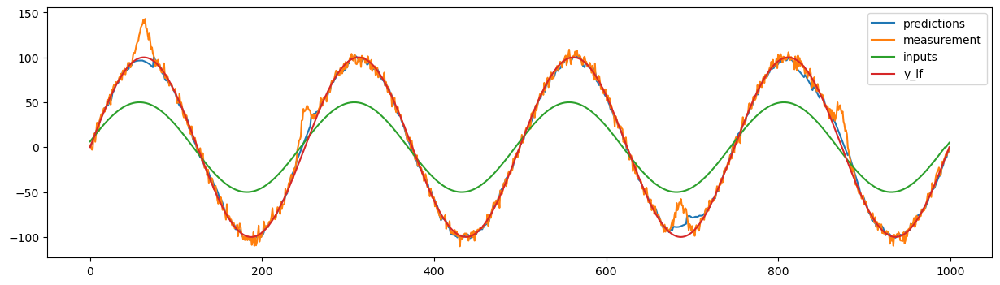

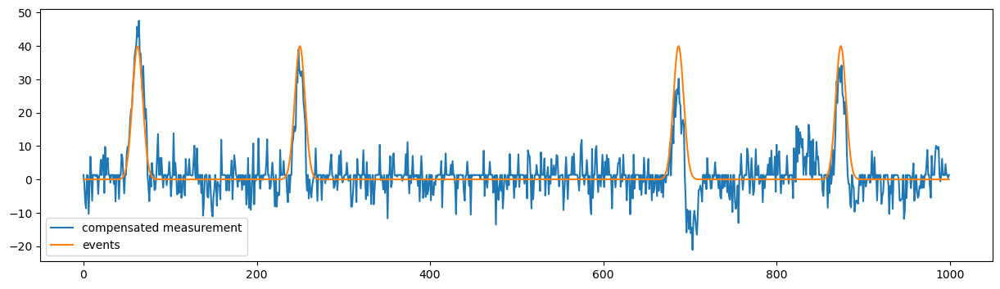

event_to_trend_amplitude: 0.2 , event_length_to_trend_period: 0.30000000000000004 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.16021393105081969, 'q_process_noise_0': 0.7582651627942234, 'loc': 0.2903587283864476}
mse: 60.575846655944275


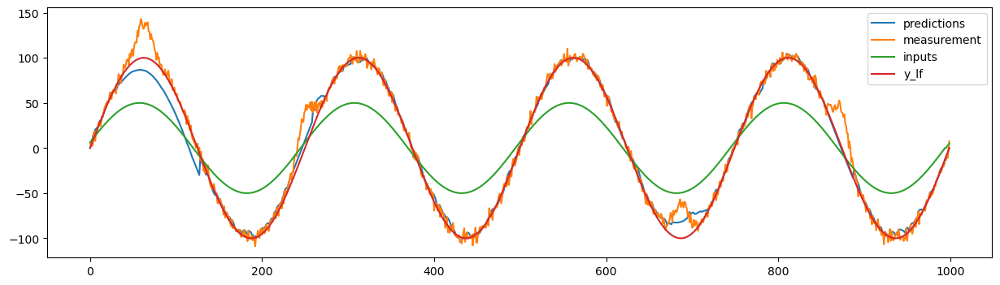

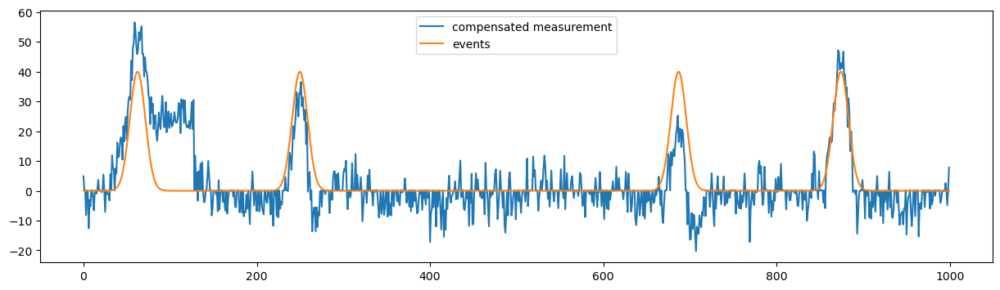

event_to_trend_amplitude: 0.2 , event_length_to_trend_period: 0.4 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.4707403917492837, 'q_process_noise_0': 0.5781583045787876, 'loc': 1.874741760005796}
mse: 61.20673328080212


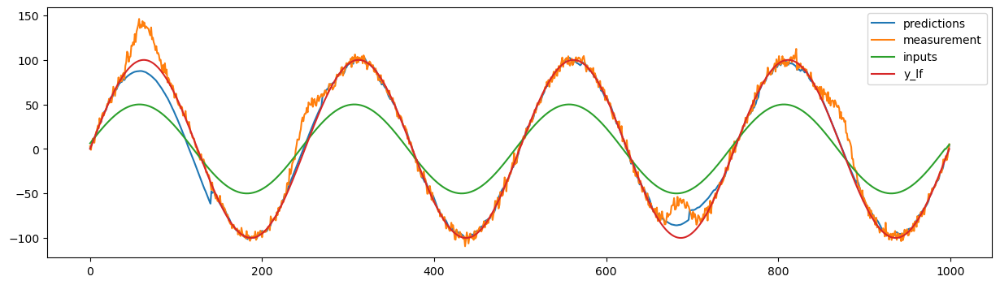

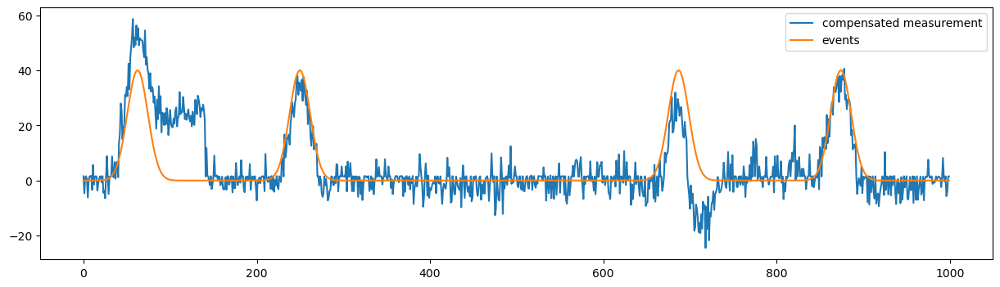

event_to_trend_amplitude: 0.2 , event_length_to_trend_period: 0.5 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.05873665417381812, 'q_process_noise_0': 0.761225580599819, 'loc': 2.984377513010163}
mse: 74.08710993050565


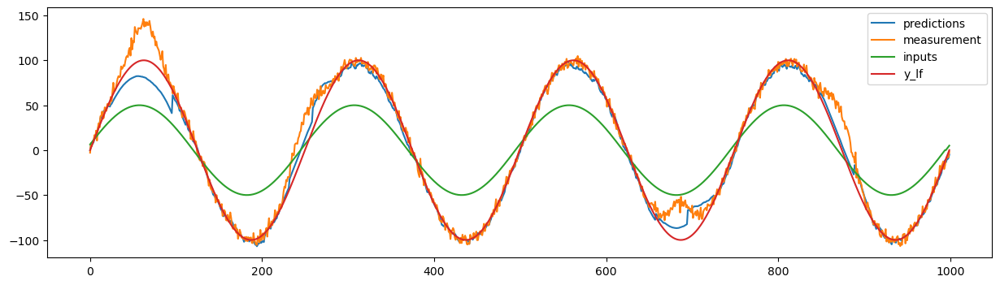

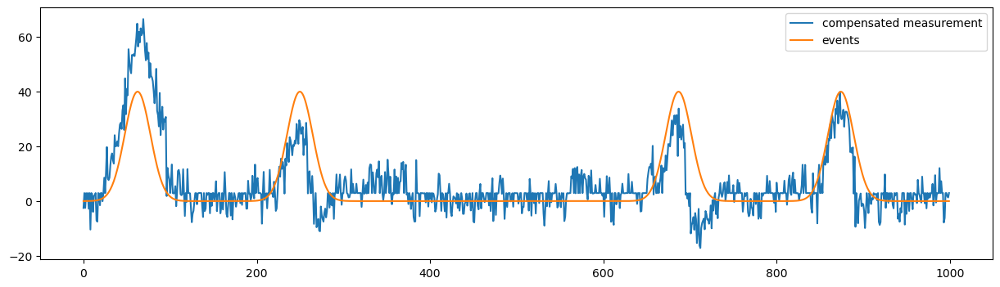

event_to_trend_amplitude: 0.30000000000000004 , event_length_to_trend_period: 0.1 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.012213548451677053, 'q_process_noise_0': 0.7351668811523089, 'loc': 0.6640851151003337}
mse: 11.752532058641734


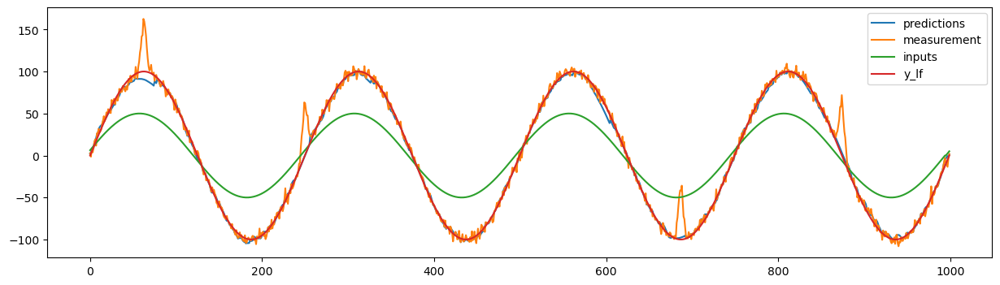

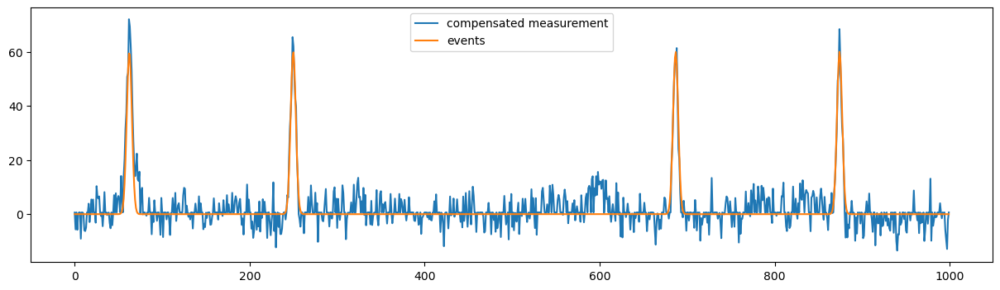

event_to_trend_amplitude: 0.30000000000000004 , event_length_to_trend_period: 0.2 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.36226419197266674, 'q_process_noise_0': 0.7515959186848334, 'loc': 1.5540900747052184}
mse: 15.934921360370135


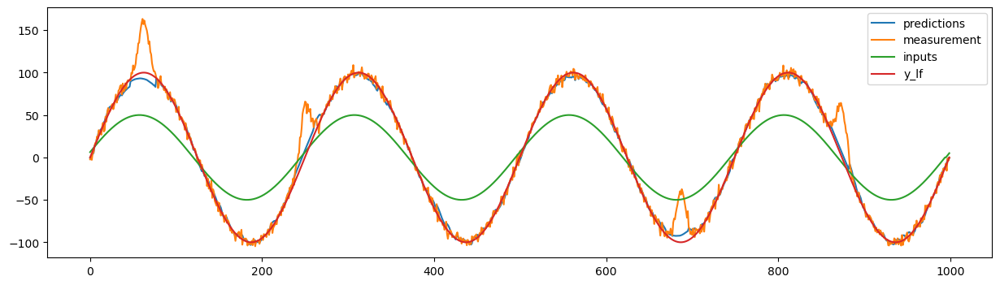

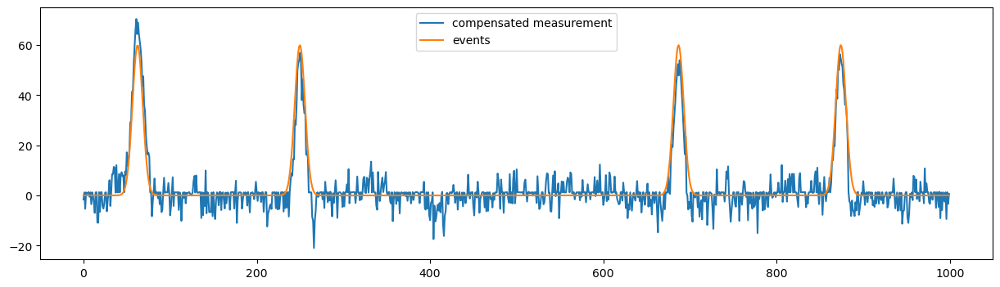

event_to_trend_amplitude: 0.30000000000000004 , event_length_to_trend_period: 0.30000000000000004 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.009377040750522522, 'q_process_noise_0': 0.7347933227081137, 'loc': 0.004027140427182342}
mse: 22.383872154651357


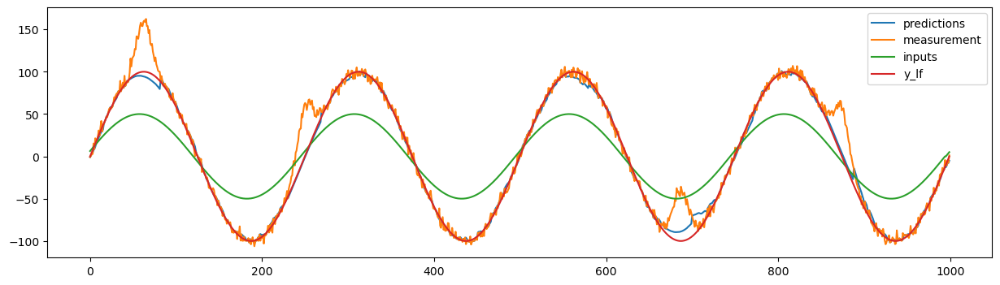

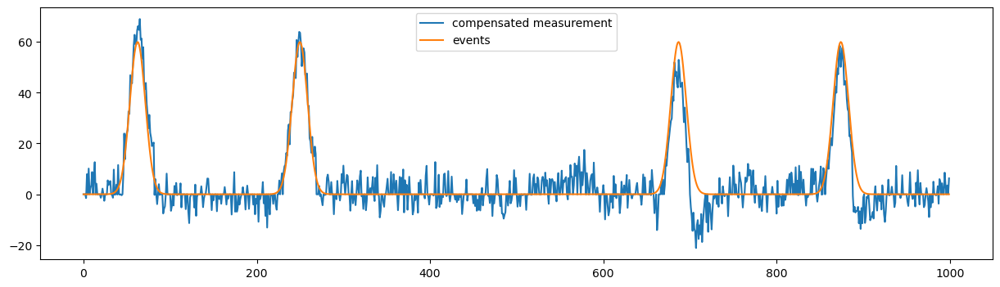

event_to_trend_amplitude: 0.30000000000000004 , event_length_to_trend_period: 0.4 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.021333055392953208, 'q_process_noise_0': 0.6704195490525109, 'loc': 0.006692959150254225}
mse: 33.44738688121372


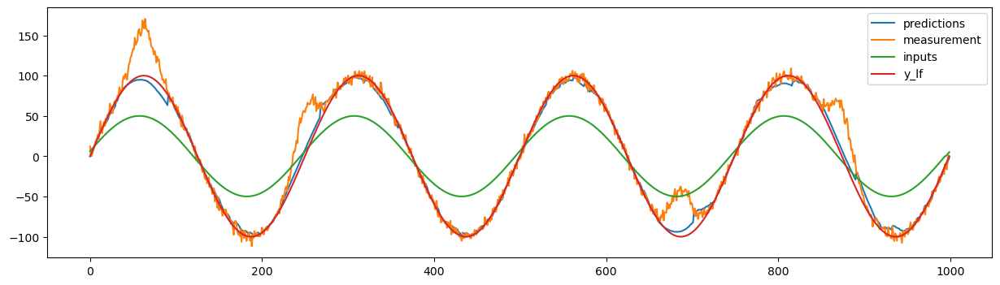

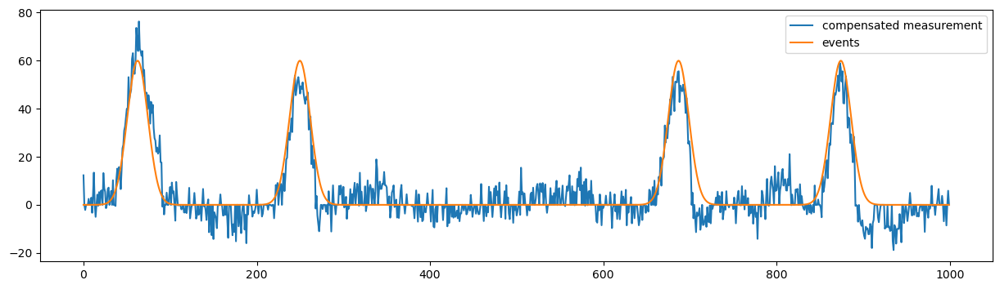

event_to_trend_amplitude: 0.30000000000000004 , event_length_to_trend_period: 0.5 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.0010178713218989472, 'q_process_noise_0': 0.705355925187223, 'loc': 0.080547737794193}
mse: 51.33563195072807


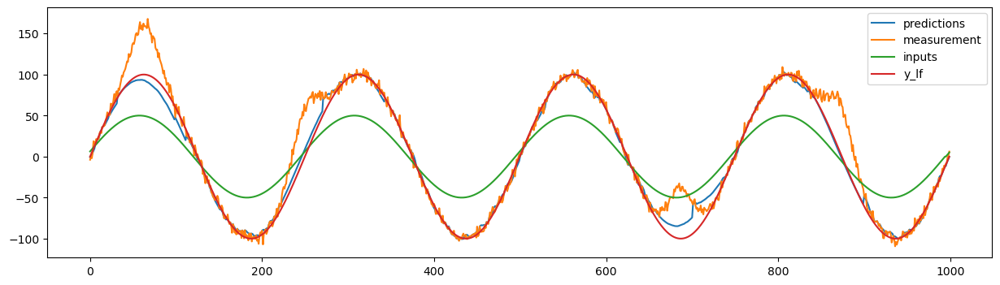

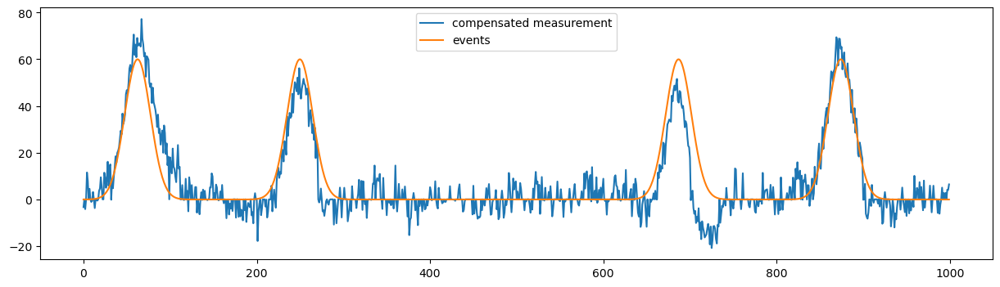

event_to_trend_amplitude: 0.4 , event_length_to_trend_period: 0.1 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 2.450356486605307, 'q_process_noise_0': 0.7307234118072953, 'loc': 4.0169803297814655}
mse: 9.610461594803683


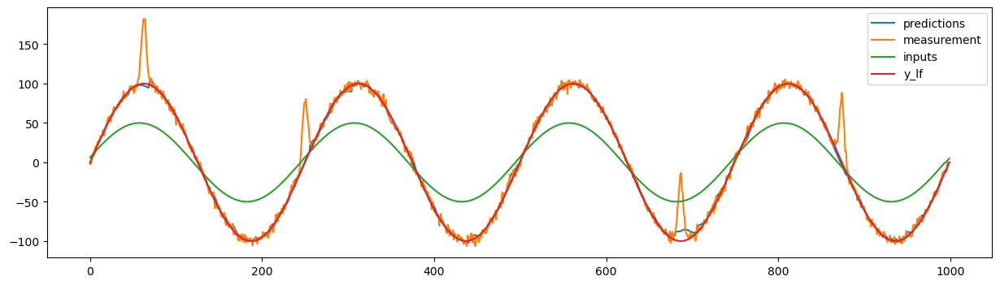

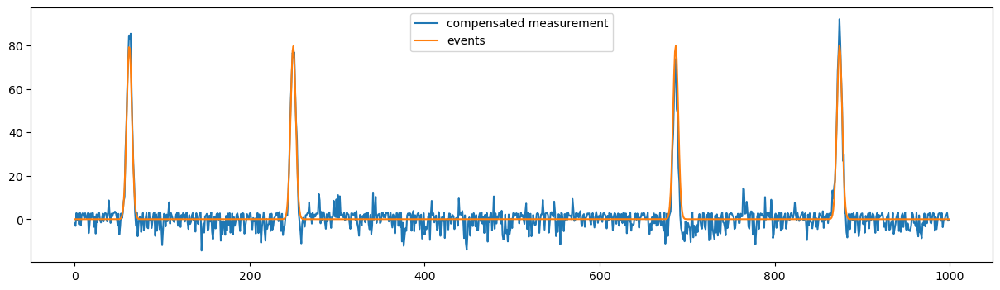

event_to_trend_amplitude: 0.4 , event_length_to_trend_period: 0.2 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.7960368751791783, 'q_process_noise_0': 0.7046495260929854, 'loc': 2.7425762992667293}
mse: 13.843751184486848


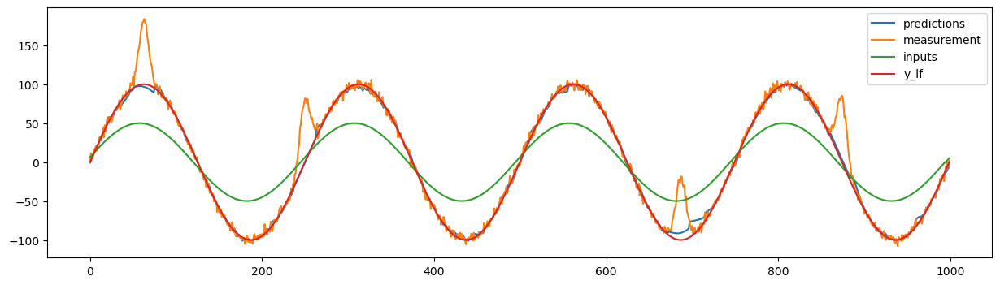

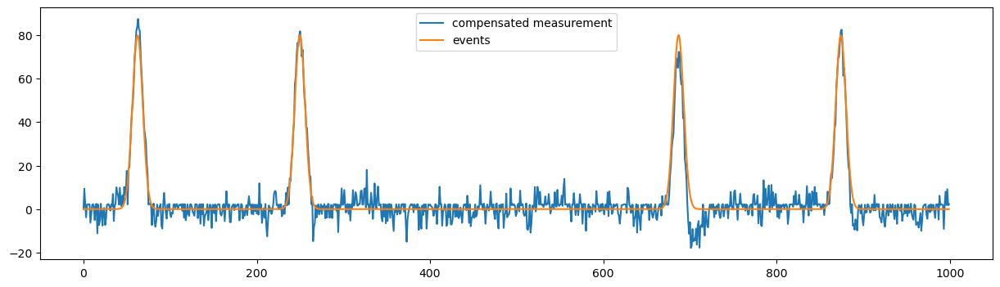

event_to_trend_amplitude: 0.4 , event_length_to_trend_period: 0.30000000000000004 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.0867651439862987, 'q_process_noise_0': 0.7561232973794154, 'loc': 0.6605147655559421}
mse: 23.81454678931043


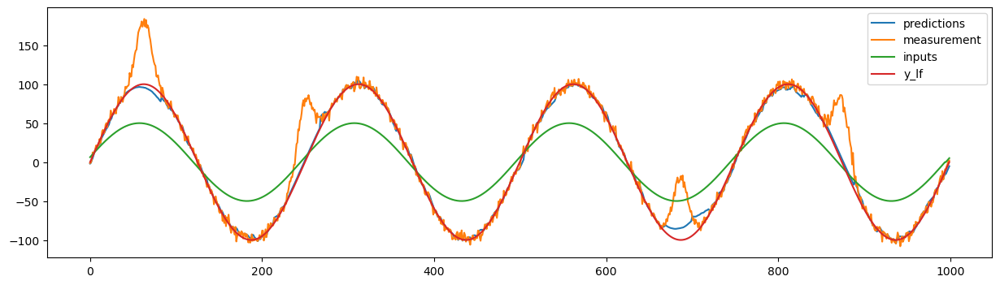

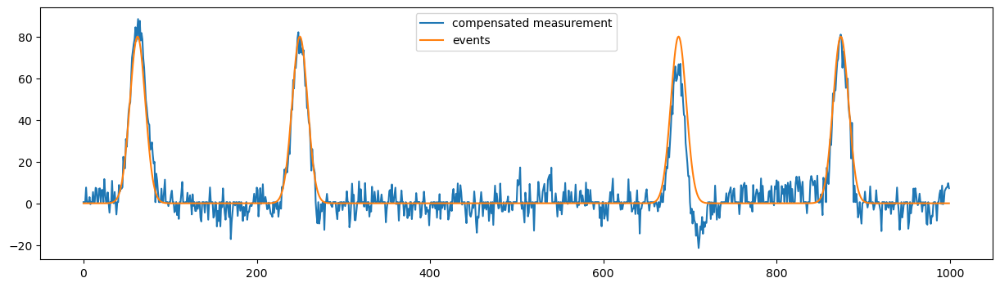

event_to_trend_amplitude: 0.4 , event_length_to_trend_period: 0.4 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 7.979421101380985, 'q_process_noise_0': 0.4551751828886796, 'loc': 9.919817477260178}
mse: 70.70444299374142


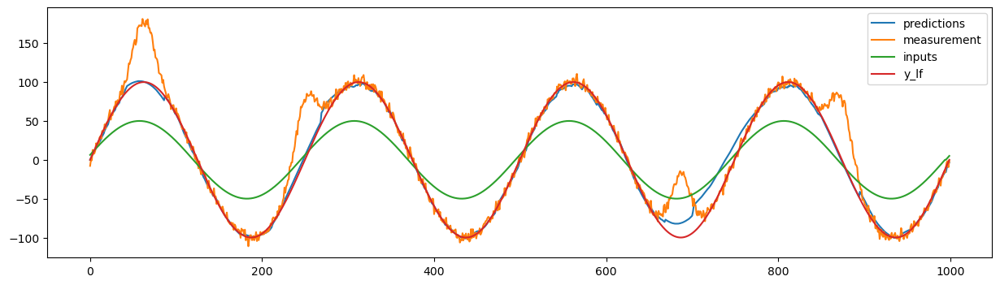

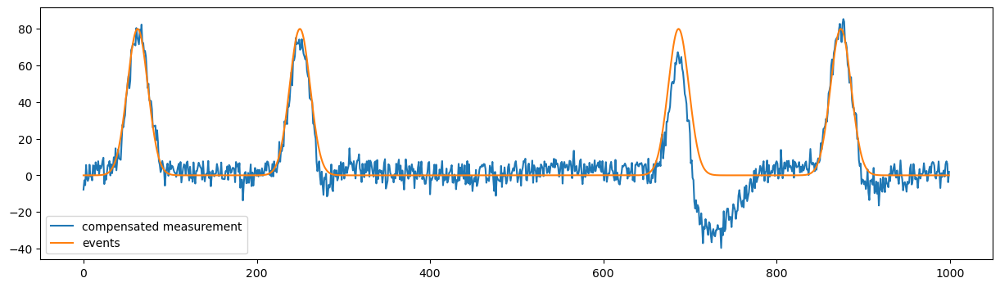

event_to_trend_amplitude: 0.4 , event_length_to_trend_period: 0.5 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.0012117025534189683, 'q_process_noise_0': 0.585829290582767, 'loc': 0.032625310558044615}
mse: 35.05029454923904


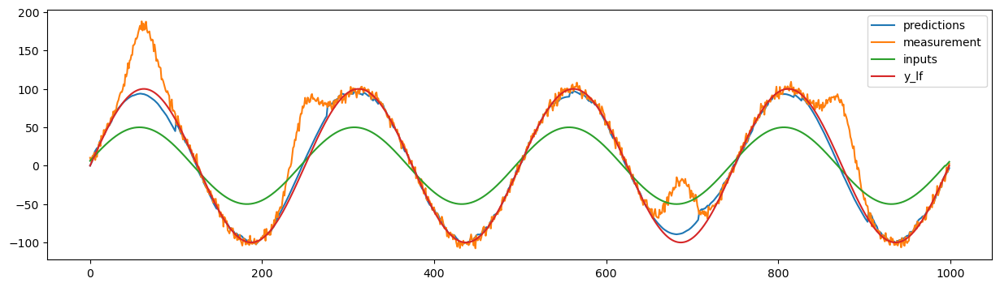

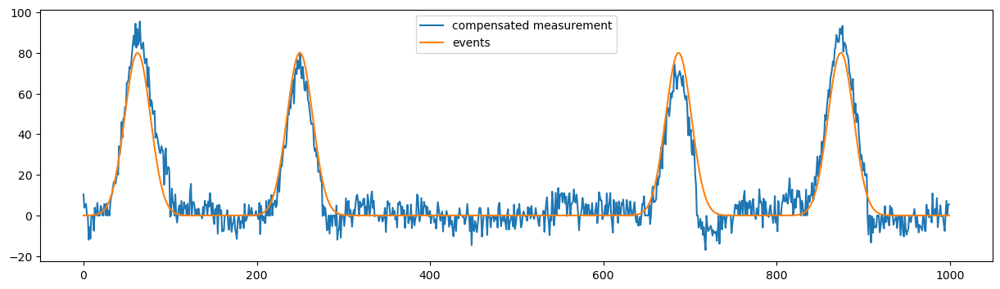

event_to_trend_amplitude: 0.5 , event_length_to_trend_period: 0.1 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.04501797502839609, 'q_process_noise_0': 0.7822901486627132, 'loc': 0.015497819409271897}
mse: 15.919305548781393


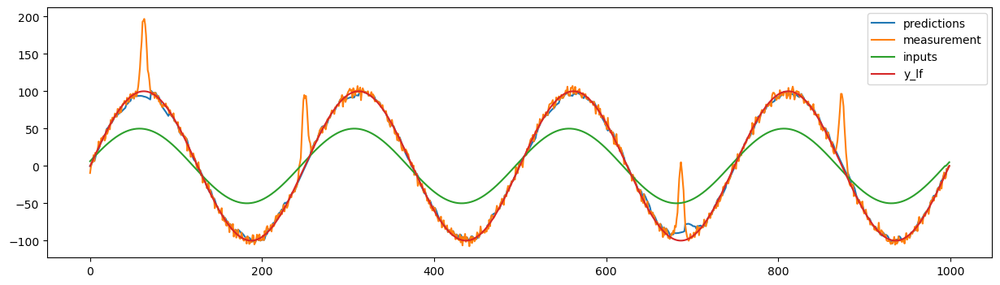

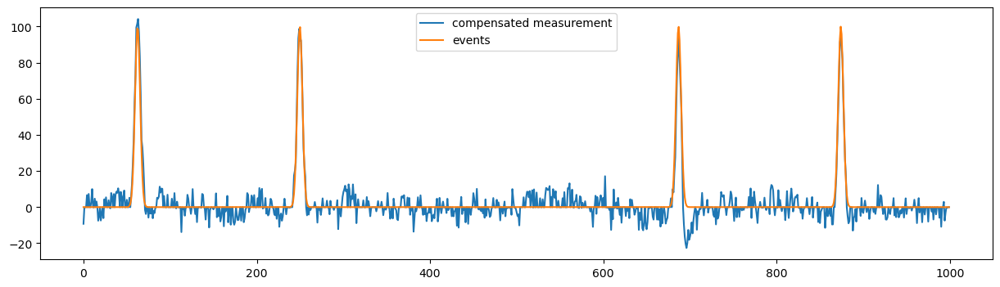

event_to_trend_amplitude: 0.5 , event_length_to_trend_period: 0.2 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.04709544605582566, 'q_process_noise_0': 0.7879615163472294, 'loc': 0.0016528821392944712}
mse: 12.588317663981895


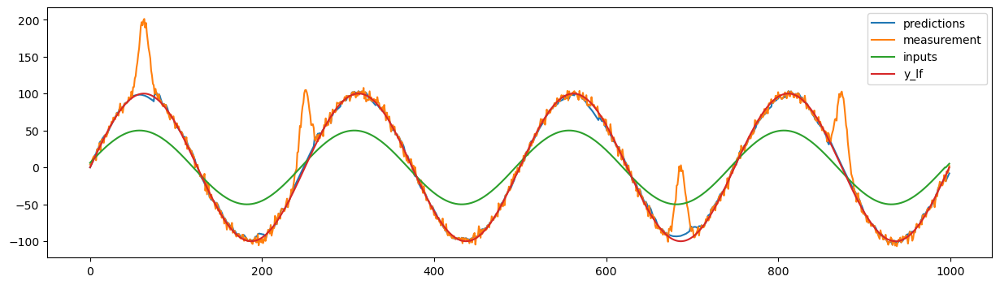

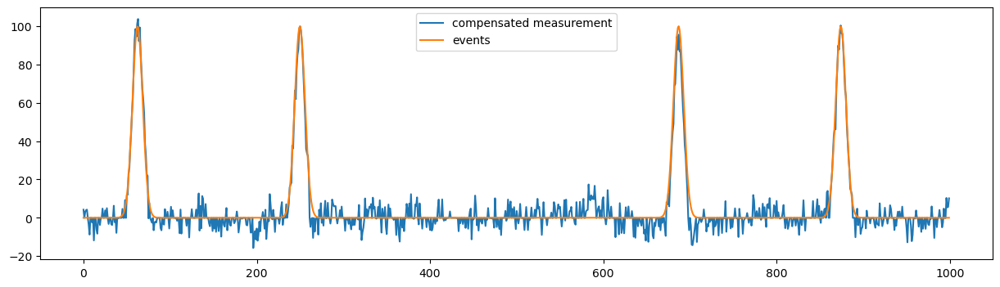

event_to_trend_amplitude: 0.5 , event_length_to_trend_period: 0.30000000000000004 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.001799184509700975, 'q_process_noise_0': 0.6449958059808338, 'loc': 0.005913405668734582}
mse: 59.08301961230395


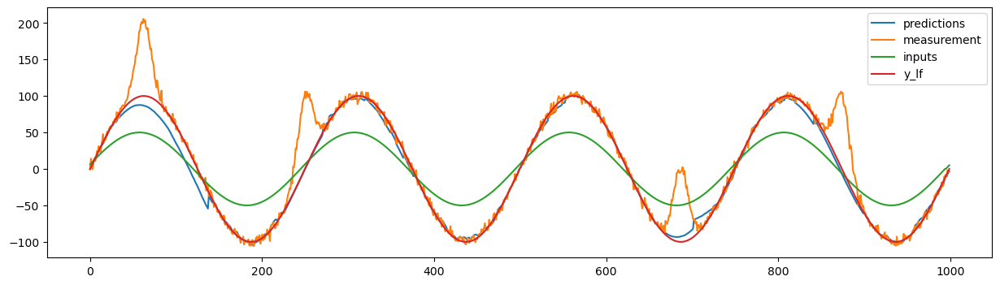

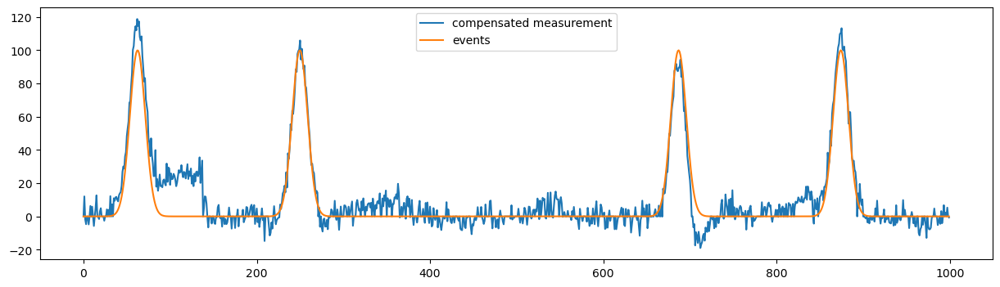

event_to_trend_amplitude: 0.5 , event_length_to_trend_period: 0.4 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.017670159620269063, 'q_process_noise_0': 0.7594521789553571, 'loc': 1.5864450560368752}
mse: 47.89549908650882


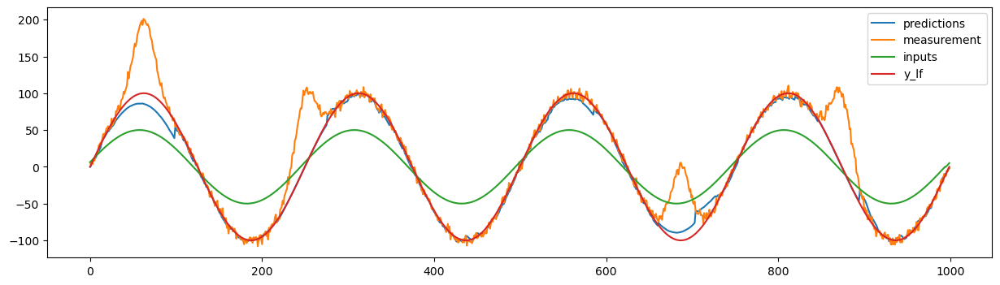

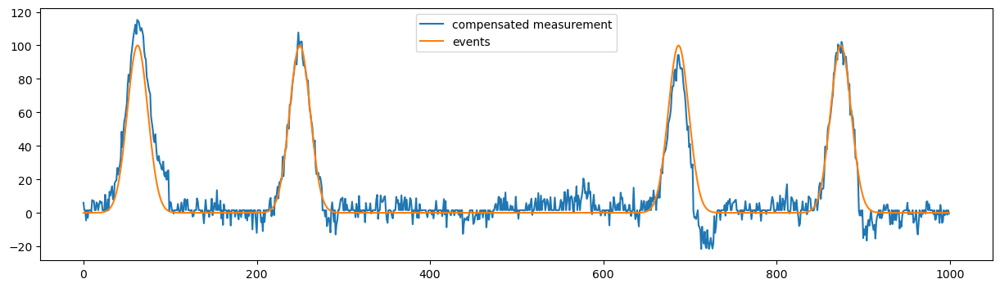

event_to_trend_amplitude: 0.5 , event_length_to_trend_period: 0.5 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.0017719818281381956, 'q_process_noise_0': 0.9977416999736194, 'loc': 1.6328709571343447}
mse: 102.82111903083536


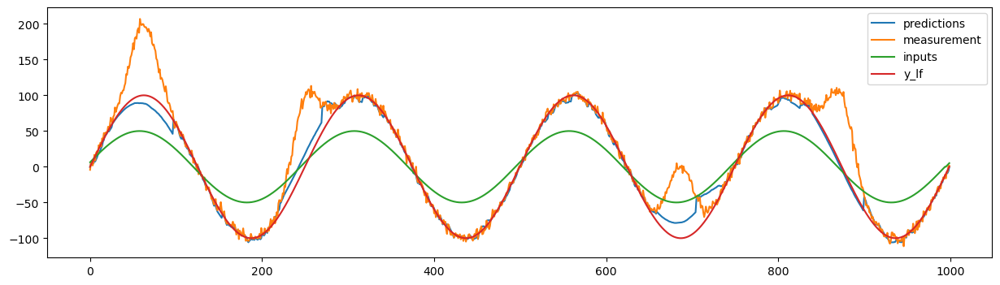

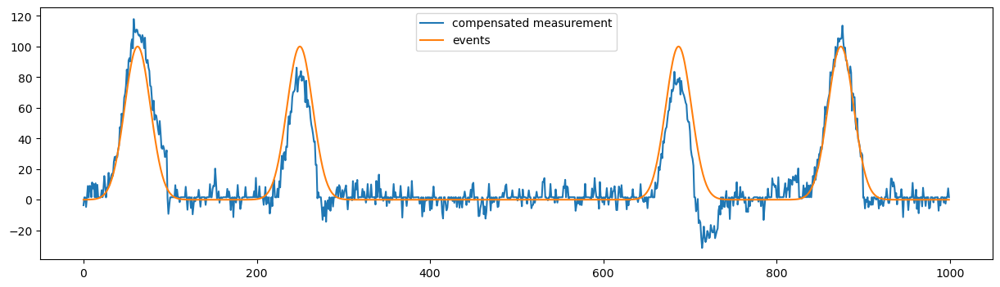

event_to_trend_amplitude: 0.6 , event_length_to_trend_period: 0.1 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.021676337111816366, 'q_process_noise_0': 0.5815286748462102, 'loc': 0.04085591136157783}
mse: 11.791940158428657


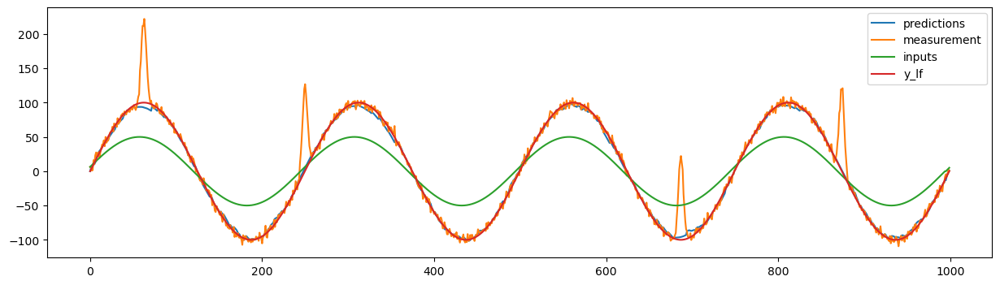

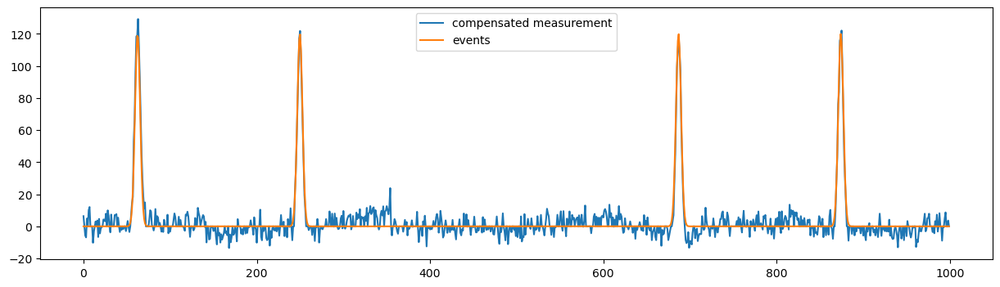

event_to_trend_amplitude: 0.6 , event_length_to_trend_period: 0.2 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.020140236035169533, 'q_process_noise_0': 0.7332693416221474, 'loc': 0.005440682500432256}
mse: 14.336165992600971


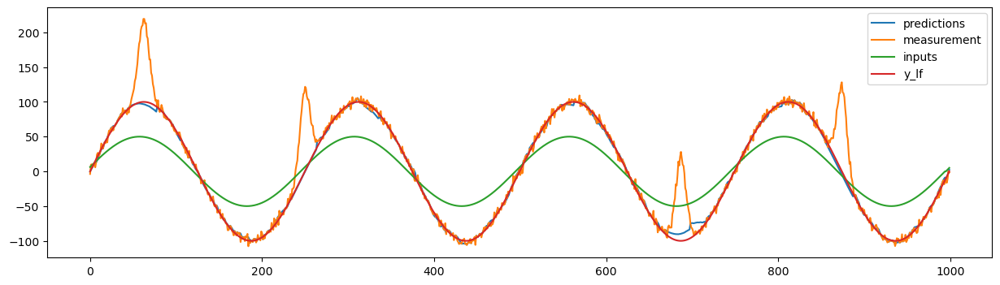

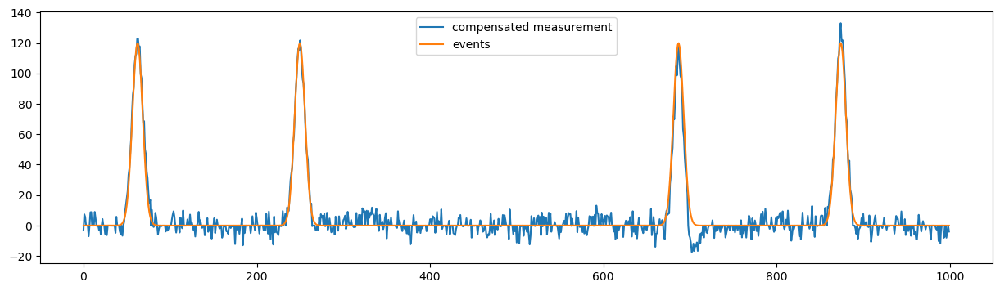

event_to_trend_amplitude: 0.6 , event_length_to_trend_period: 0.30000000000000004 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.6609098232724085, 'q_process_noise_0': 0.654582749683357, 'loc': 1.8529545776393876}
mse: 26.041656856685318


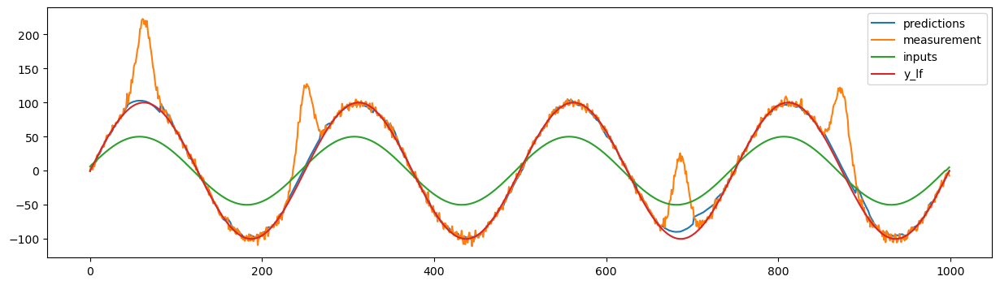

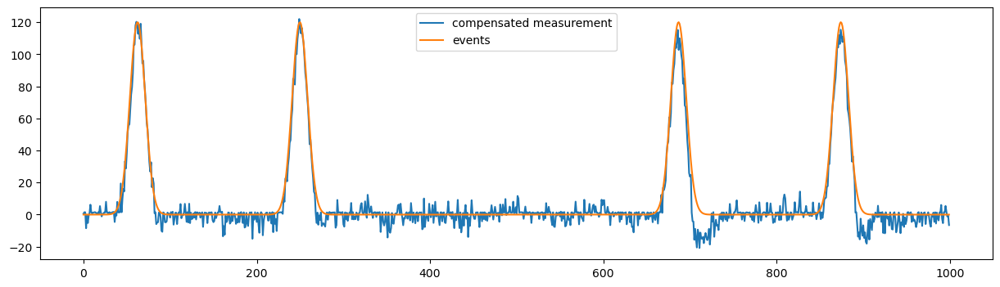

event_to_trend_amplitude: 0.6 , event_length_to_trend_period: 0.4 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.0016442367217679604, 'q_process_noise_0': 0.6206749280956743, 'loc': 0.4081274676988032}
mse: 41.604454067834254


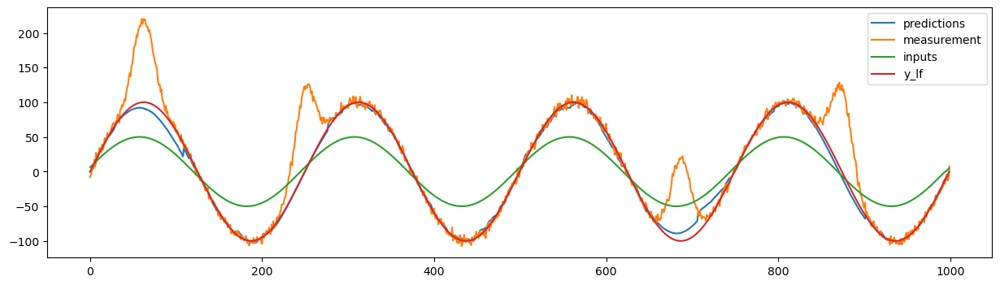

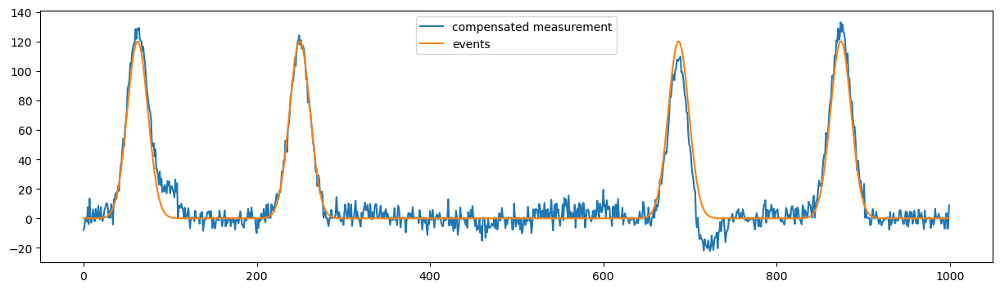

event_to_trend_amplitude: 0.6 , event_length_to_trend_period: 0.5 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.034185663038030376, 'q_process_noise_0': 0.7783850721872743, 'loc': 0.06049560436398943}
mse: 57.50138054590765


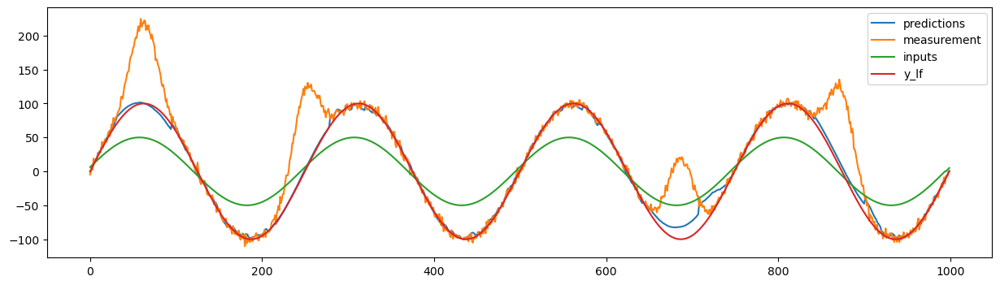

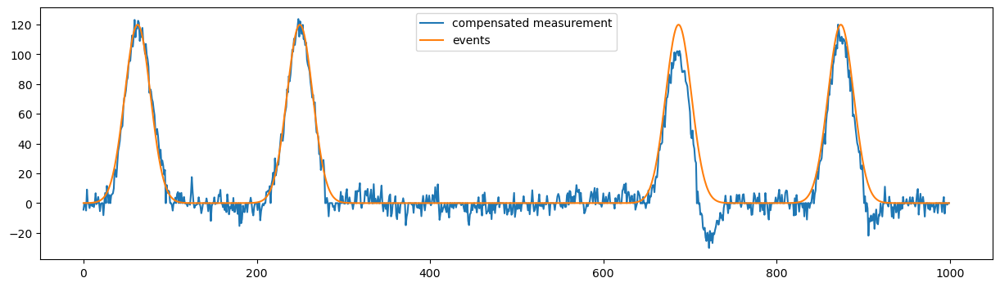

In [38]:
for key in loaded_studies.keys():
    if key[0] >= min_allowed_event_to_trend_amplitude and key[1] <= max_allowed_event_length_to_trend_period and key[2] <= max_allowed_timeshift:
        print('event_to_trend_amplitude:', key[0], ', event_length_to_trend_period:', key[1], ', time_shift:', key[2])
        print('optimal parameters:', loaded_studies[key].best_trial.params)

        inputs = np.vstack([datasets[key]['input_'], np.insert(np.diff(datasets[key]['input_']),0,0)])
        measurement = datasets[key]['y_measurements']
        y_lf = datasets[key]['y_lf']

        pf_alpha = learn_alpha(inputs[0].reshape(-1, 1), measurement)
        # Suggest values for the hyperparameters
        num_particles = 1000 # best_params[key]['num_particles']
        r_measurement_noise = loaded_studies[key].best_trial.params['r_measurement_noise']
        q_process_noise_0 = loaded_studies[key].best_trial.params['q_process_noise_0']
        loc = loaded_studies[key].best_trial.params['loc']

        pf = ParticleFilter(
            num_particles=num_particles,
            r_measurement_noise=r_measurement_noise,
            q_process_noise=np.array([q_process_noise_0, 1]),
            loc=-loc,
            alpha=pf_alpha
        )
        predictions = pf.filter(measurement, inputs, loading=loading)
        print('mse:', mean_squared_error(predictions, y_lf))
        plt.figure(figsize=(15, 4))
        plt.plot(predictions, label='predictions')
        plt.plot(measurement, label='measurement')
        plt.plot(inputs[0], label='inputs')
        plt.plot(y_lf, label='y_lf')
        plt.legend()
        plt.show()
        plt.close()
        plt.figure(figsize=(15, 4))
        plt.plot(measurement-predictions, label='compensated measurement')
        plt.plot(datasets[key]['y_events'], label='events')
        plt.legend()
        plt.show()
        plt.close()

event_to_trend_amplitude: 0.1 , event_length_to_trend_period: 0.1 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 2.094572813671195, 'q_process_noise_0': 0.6174981020049883, 'loc': 3.3542628631060727}
mse: 8.119538868074146


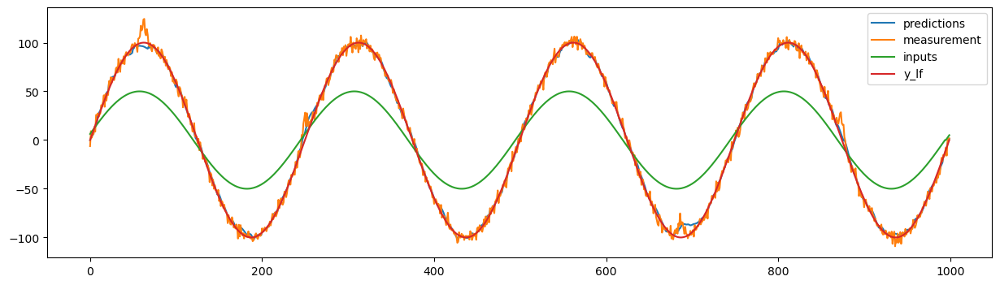

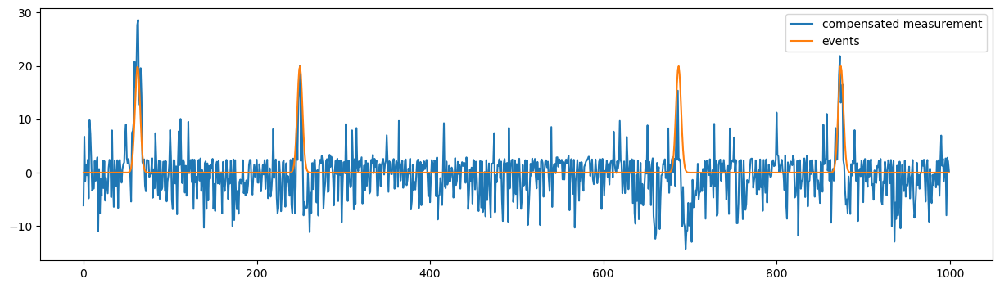

event_to_trend_amplitude: 0.1 , event_length_to_trend_period: 0.2 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.010178472438621761, 'q_process_noise_0': 0.9198177180683554, 'loc': 0.5077221592888737}
mse: 20.17019701050118


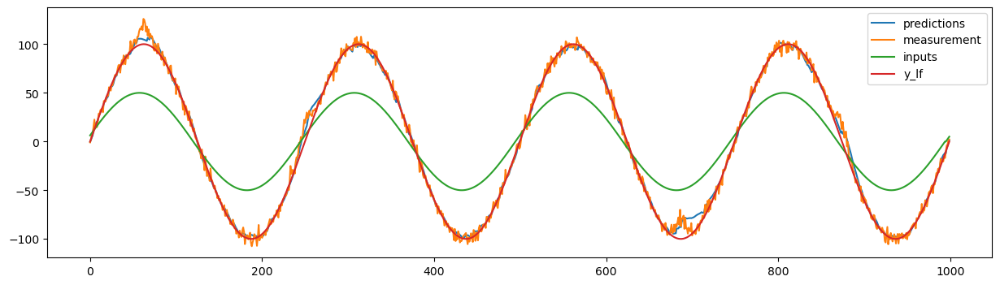

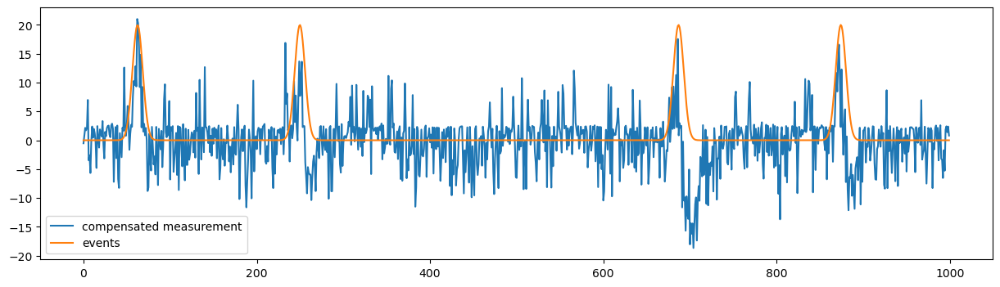

event_to_trend_amplitude: 0.1 , event_length_to_trend_period: 0.30000000000000004 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.001389425303506905, 'q_process_noise_0': 0.5266267763791975, 'loc': 0.7043089804194981}
mse: 29.379859339039037


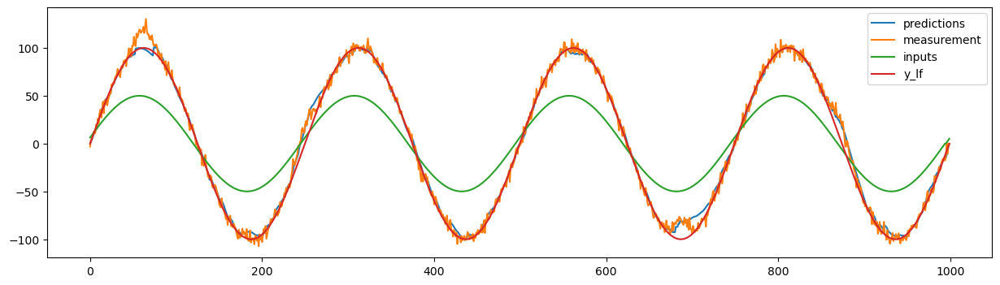

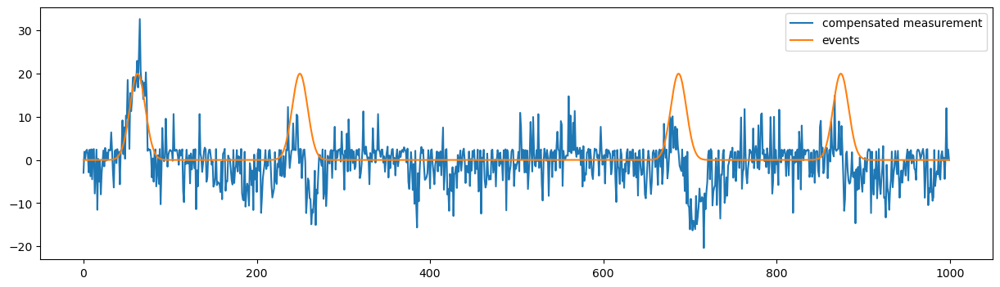

event_to_trend_amplitude: 0.1 , event_length_to_trend_period: 0.4 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.0021073127917757267, 'q_process_noise_0': 0.6522297851721249, 'loc': 0.3950313546977383}
mse: 44.213858194229225


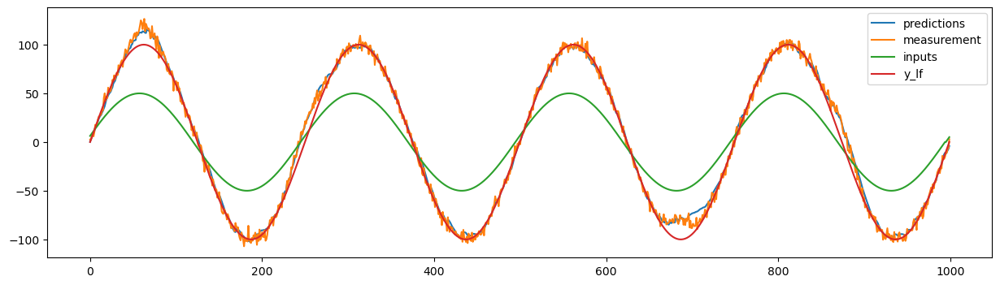

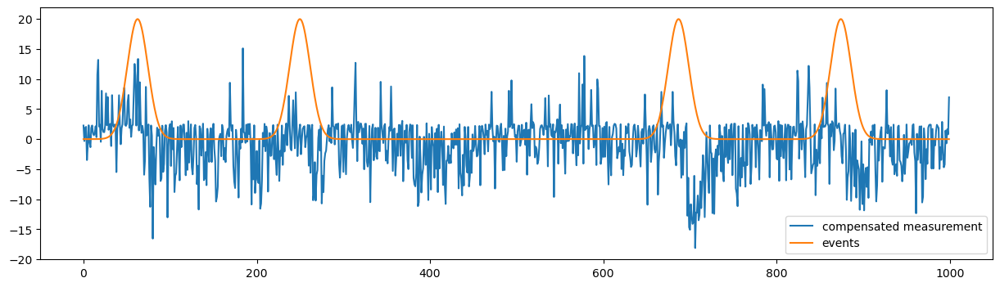

event_to_trend_amplitude: 0.1 , event_length_to_trend_period: 0.5 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.1004029056612093, 'q_process_noise_0': 0.5895109554833241, 'loc': 2.265564789821639}
mse: 42.24157733995323


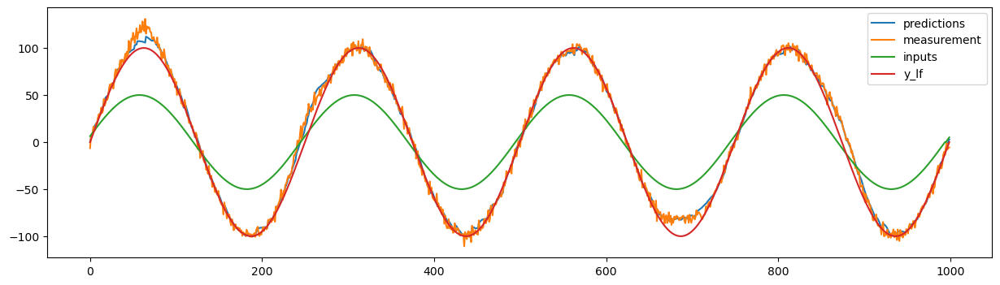

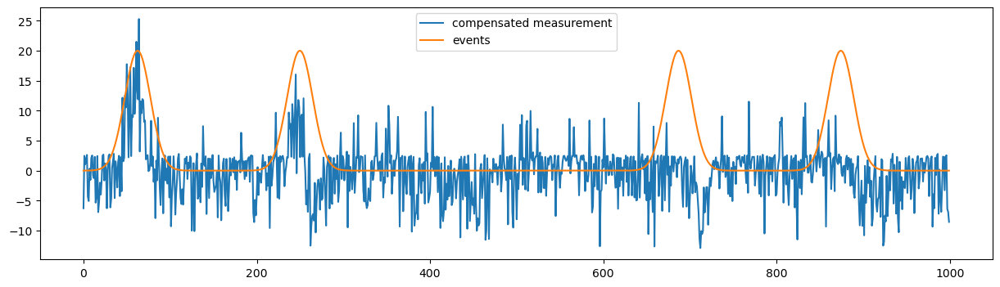

event_to_trend_amplitude: 0.2 , event_length_to_trend_period: 0.1 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.050798426524487864, 'q_process_noise_0': 0.8128414571372573, 'loc': 0.0016233700836324621}
mse: 7.632731092899717


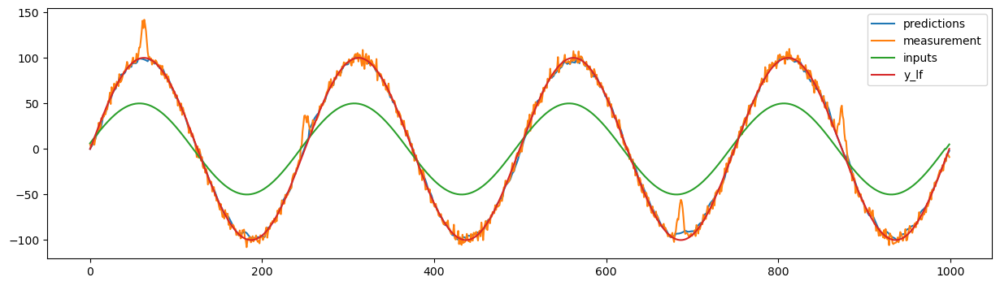

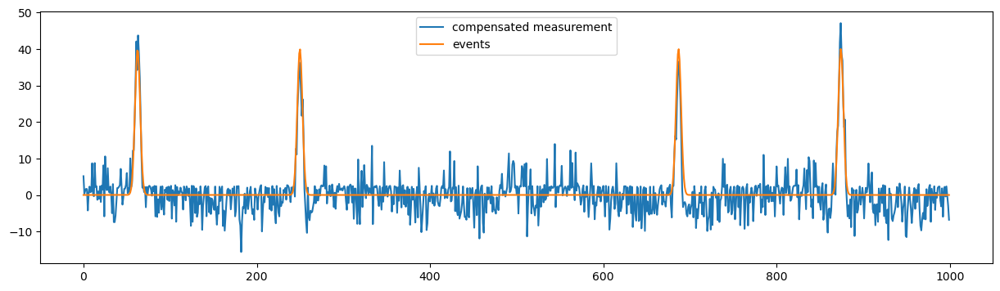

event_to_trend_amplitude: 0.2 , event_length_to_trend_period: 0.2 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.11286655414725297, 'q_process_noise_0': 0.7691877343847088, 'loc': 1.4616940538642444}
mse: 18.130655529369367


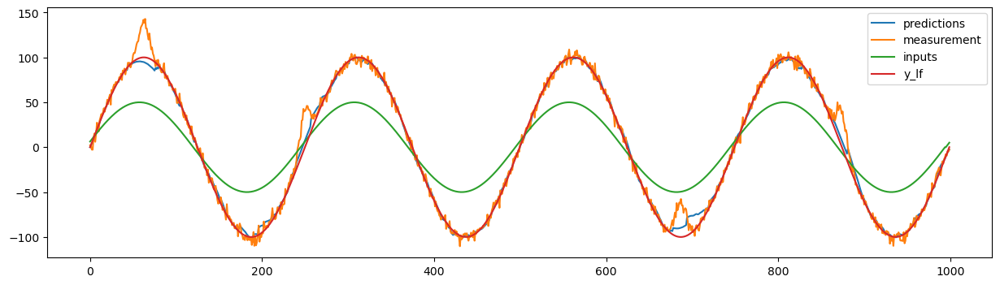

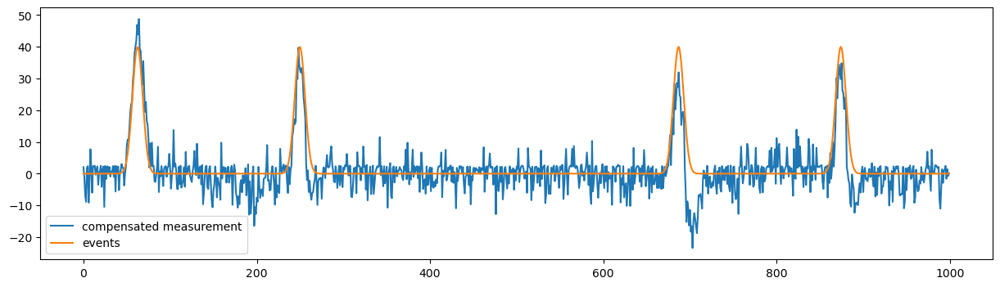

event_to_trend_amplitude: 0.2 , event_length_to_trend_period: 0.30000000000000004 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.16021393105081969, 'q_process_noise_0': 0.7582651627942234, 'loc': 0.2903587283864476}
mse: 25.26335193028926


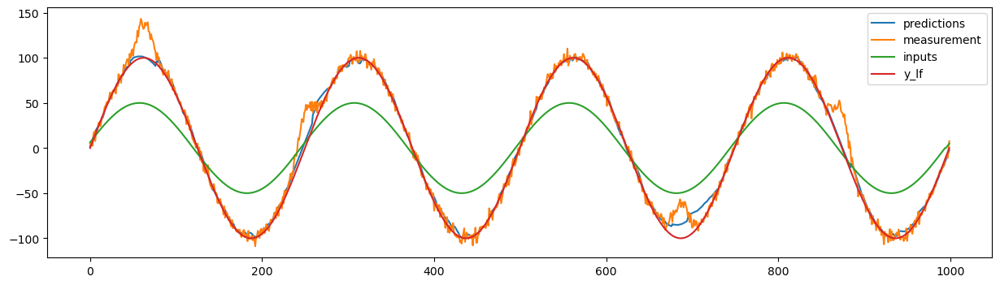

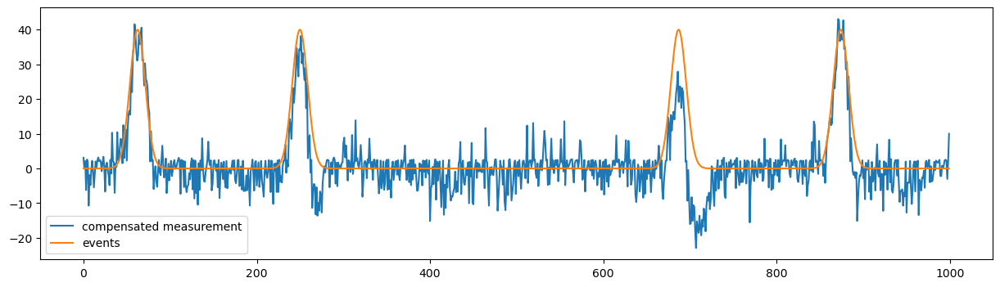

event_to_trend_amplitude: 0.2 , event_length_to_trend_period: 0.4 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.4707403917492837, 'q_process_noise_0': 0.5781583045787876, 'loc': 1.874741760005796}
mse: 32.52824995761866


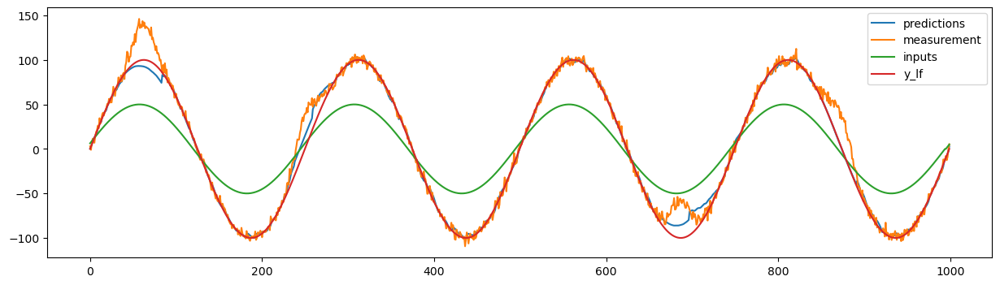

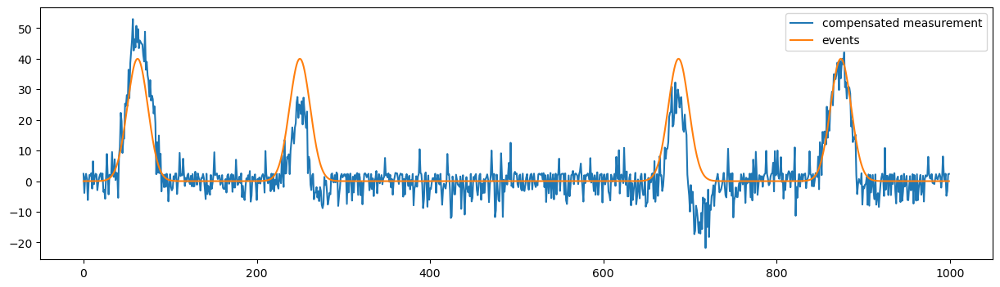

event_to_trend_amplitude: 0.2 , event_length_to_trend_period: 0.5 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.05873665417381812, 'q_process_noise_0': 0.761225580599819, 'loc': 2.984377513010163}
mse: 64.37412797576536


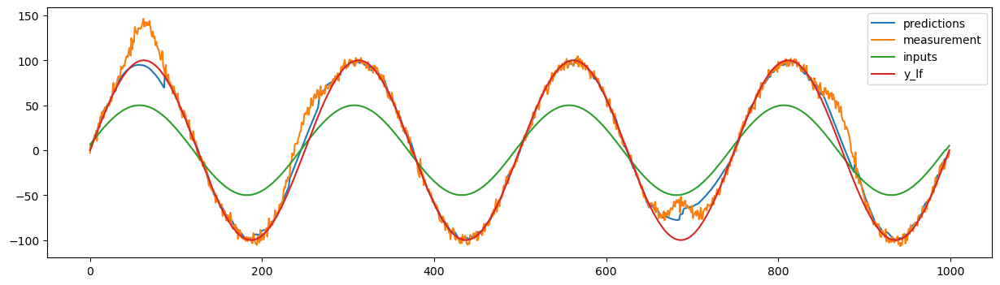

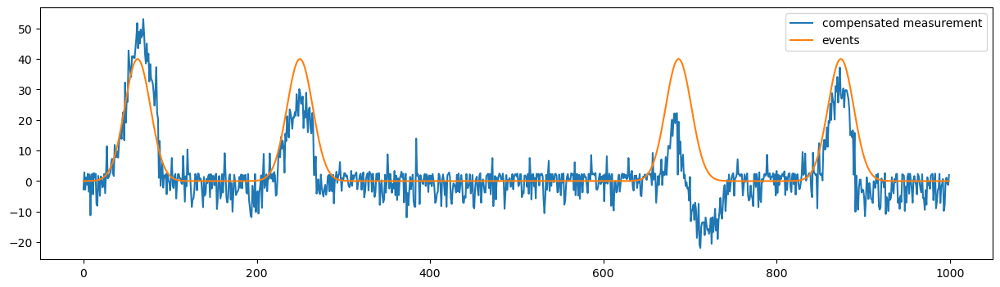

event_to_trend_amplitude: 0.30000000000000004 , event_length_to_trend_period: 0.1 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.012213548451677053, 'q_process_noise_0': 0.7351668811523089, 'loc': 0.6640851151003337}
mse: 7.011406820644855


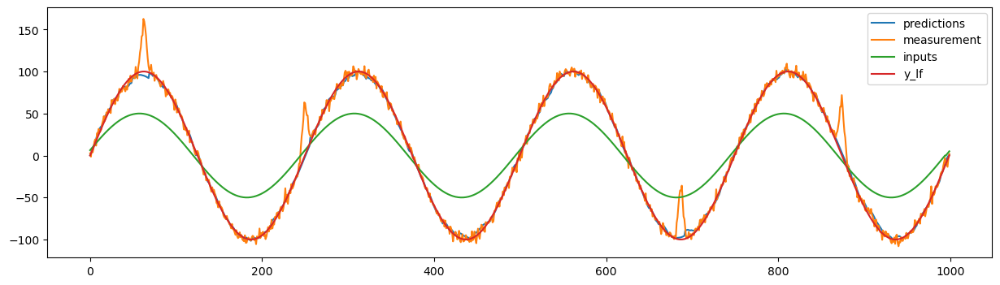

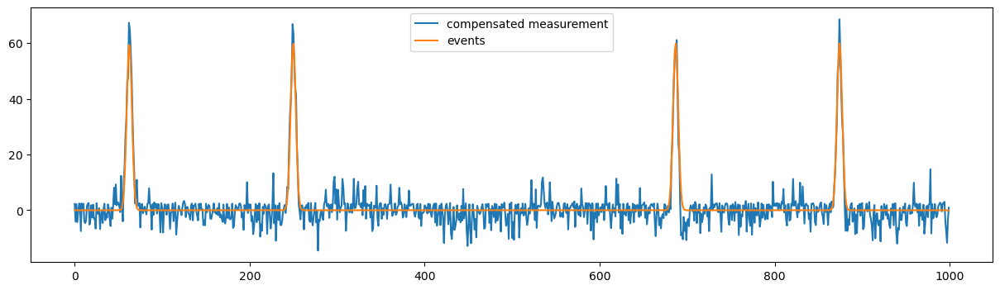

event_to_trend_amplitude: 0.30000000000000004 , event_length_to_trend_period: 0.2 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.36226419197266674, 'q_process_noise_0': 0.7515959186848334, 'loc': 1.5540900747052184}
mse: 14.57326818704748


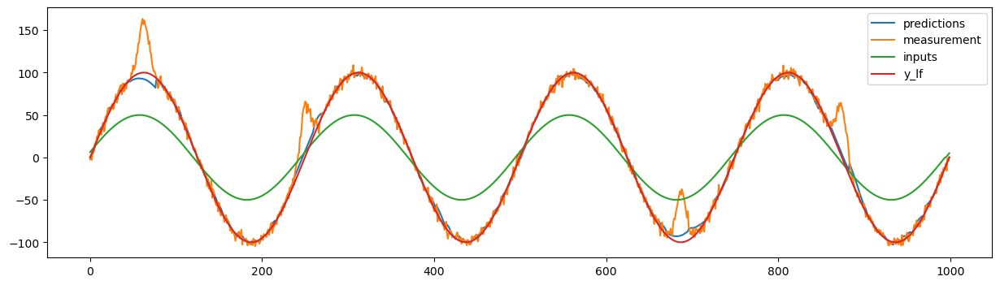

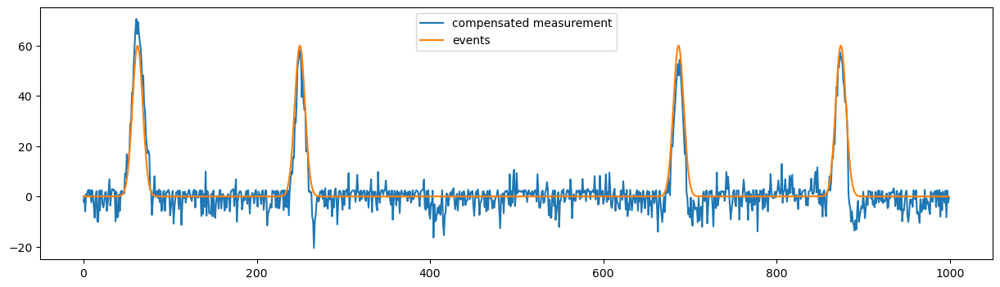

event_to_trend_amplitude: 0.30000000000000004 , event_length_to_trend_period: 0.30000000000000004 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.009377040750522522, 'q_process_noise_0': 0.7347933227081137, 'loc': 0.004027140427182342}
mse: 36.28653790890671


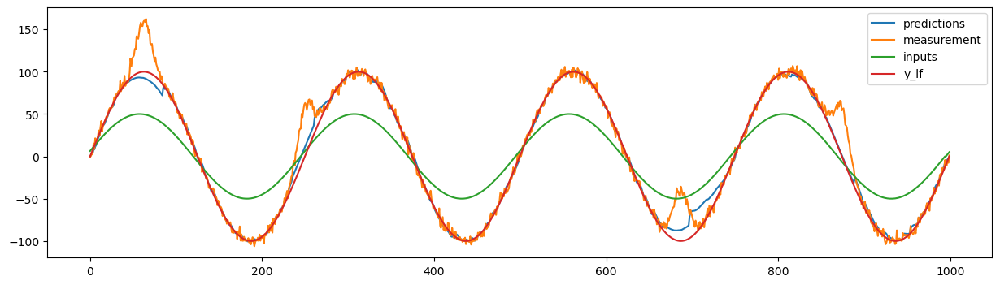

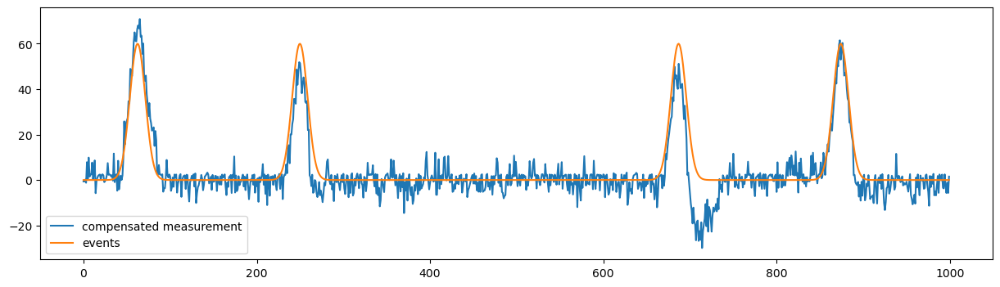

event_to_trend_amplitude: 0.30000000000000004 , event_length_to_trend_period: 0.4 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.021333055392953208, 'q_process_noise_0': 0.6704195490525109, 'loc': 0.006692959150254225}
mse: 45.3370004427067


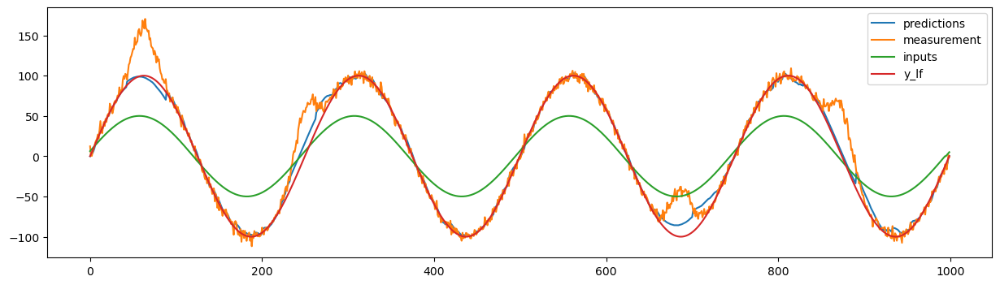

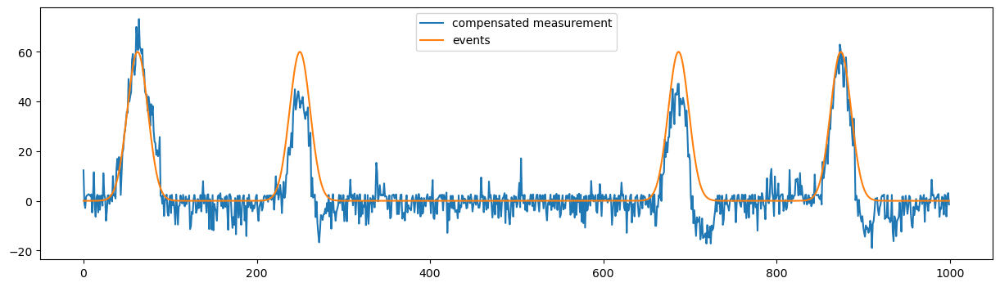

event_to_trend_amplitude: 0.30000000000000004 , event_length_to_trend_period: 0.5 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.0010178713218989472, 'q_process_noise_0': 0.705355925187223, 'loc': 0.080547737794193}
mse: 41.3312779143372


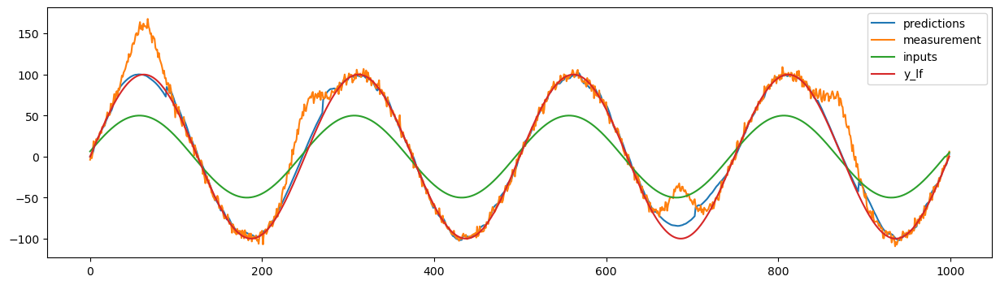

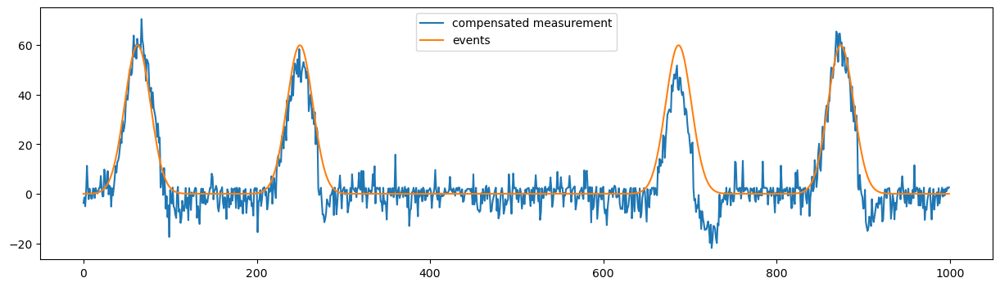

event_to_trend_amplitude: 0.4 , event_length_to_trend_period: 0.1 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 2.450356486605307, 'q_process_noise_0': 0.7307234118072953, 'loc': 4.0169803297814655}
mse: 9.294161570897241


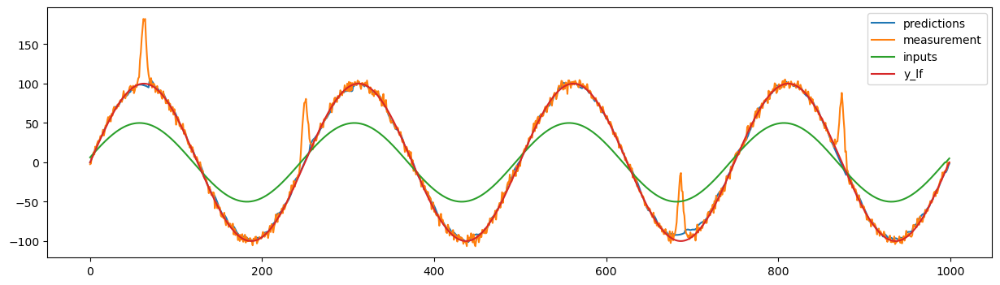

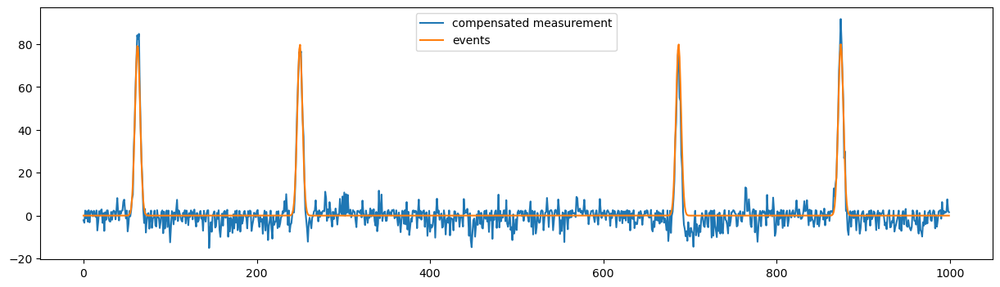

event_to_trend_amplitude: 0.4 , event_length_to_trend_period: 0.2 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.7960368751791783, 'q_process_noise_0': 0.7046495260929854, 'loc': 2.7425762992667293}
mse: 20.984647912505046


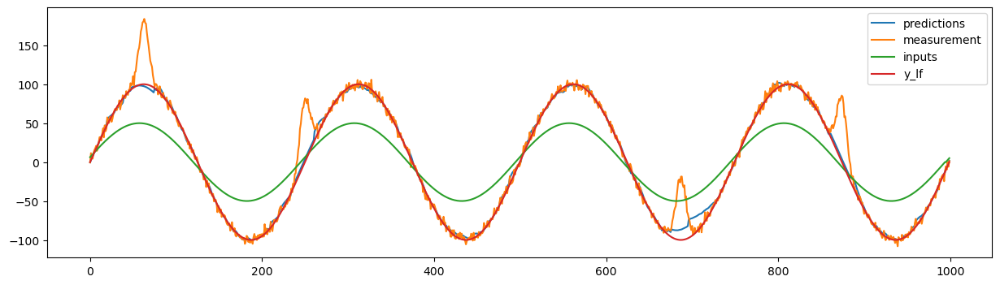

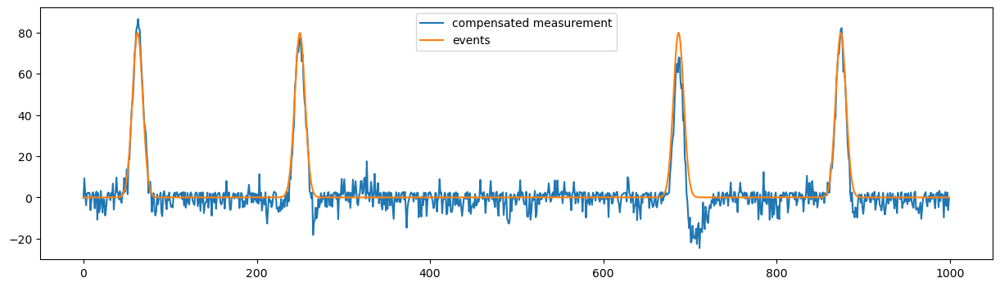

event_to_trend_amplitude: 0.4 , event_length_to_trend_period: 0.30000000000000004 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.0867651439862987, 'q_process_noise_0': 0.7561232973794154, 'loc': 0.6605147655559421}
mse: 20.253553273541225


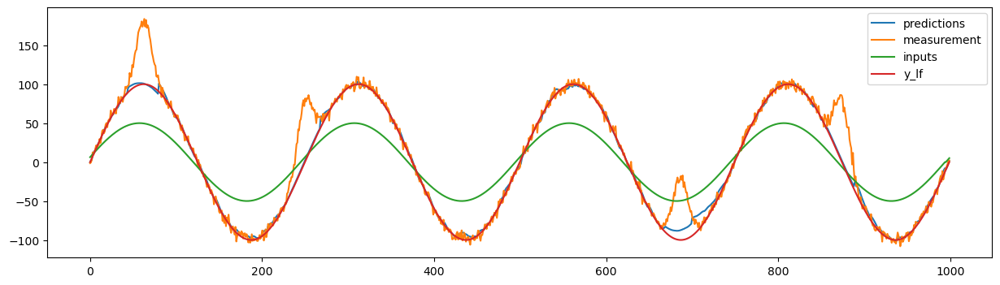

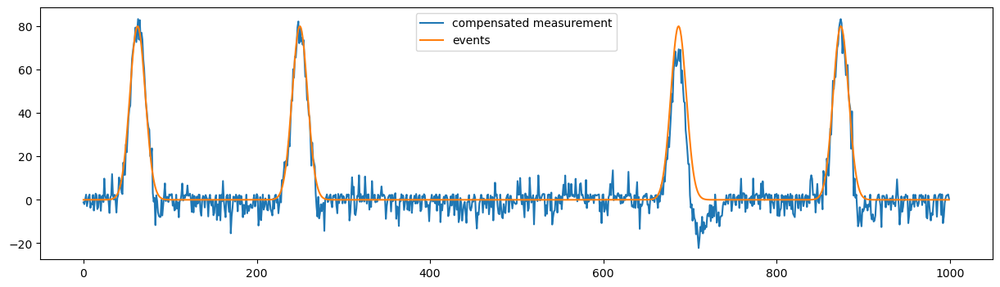

event_to_trend_amplitude: 0.4 , event_length_to_trend_period: 0.4 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 7.979421101380985, 'q_process_noise_0': 0.4551751828886796, 'loc': 9.919817477260178}
mse: 53.261641228673234


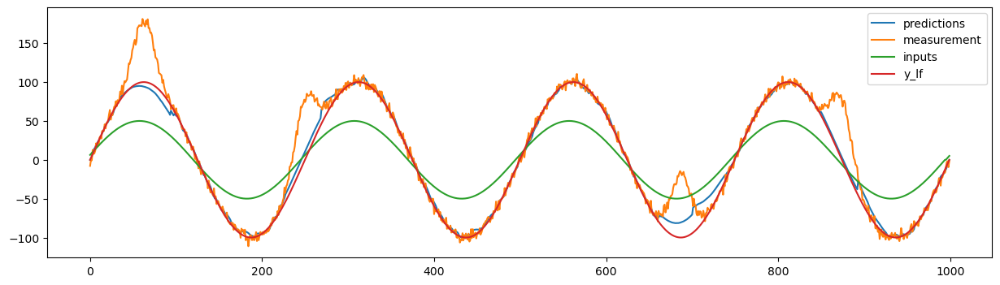

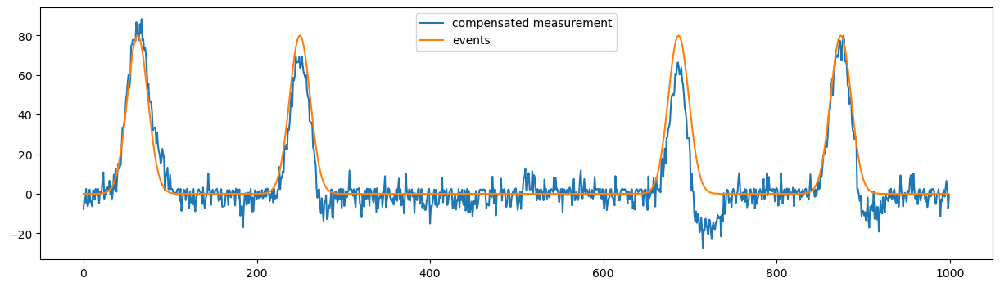

event_to_trend_amplitude: 0.4 , event_length_to_trend_period: 0.5 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.0012117025534189683, 'q_process_noise_0': 0.585829290582767, 'loc': 0.032625310558044615}
mse: 60.659919084670165


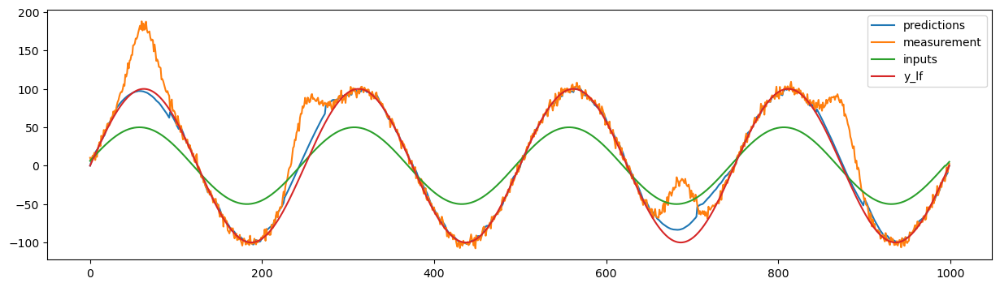

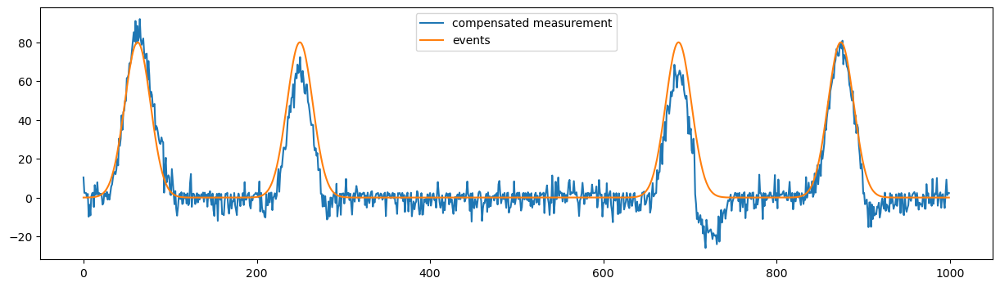

event_to_trend_amplitude: 0.5 , event_length_to_trend_period: 0.1 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.04501797502839609, 'q_process_noise_0': 0.7822901486627132, 'loc': 0.015497819409271897}
mse: 8.872220716253155


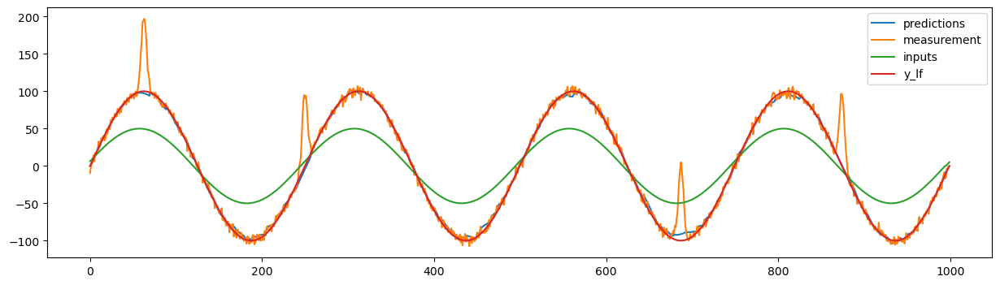

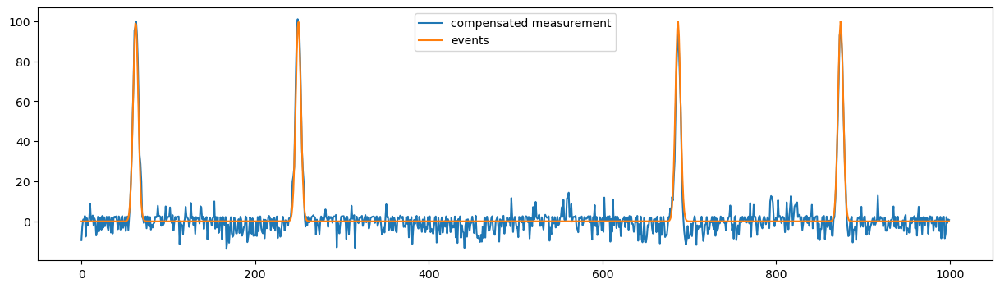

event_to_trend_amplitude: 0.5 , event_length_to_trend_period: 0.2 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.04709544605582566, 'q_process_noise_0': 0.7879615163472294, 'loc': 0.0016528821392944712}
mse: 18.640301808522587


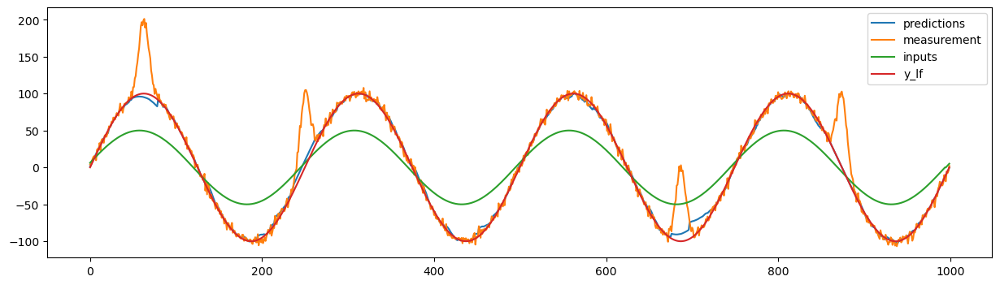

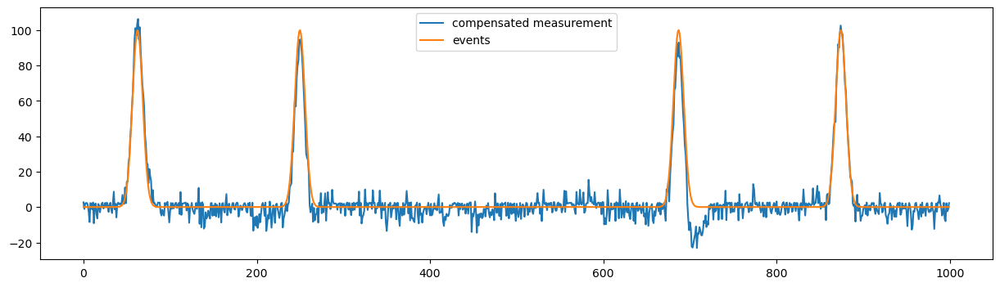

event_to_trend_amplitude: 0.5 , event_length_to_trend_period: 0.30000000000000004 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.001799184509700975, 'q_process_noise_0': 0.6449958059808338, 'loc': 0.005913405668734582}
mse: 32.41169439510491


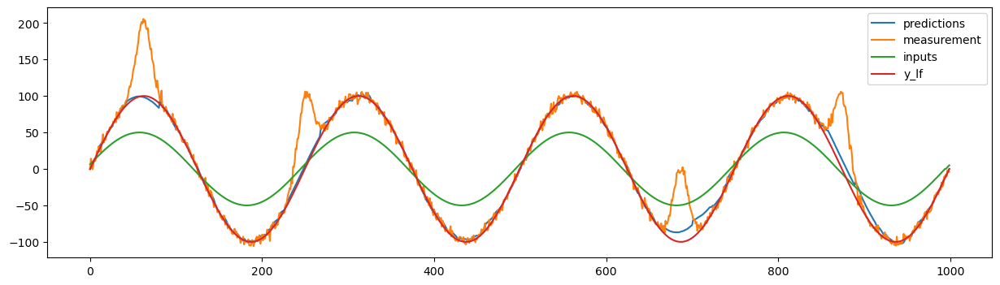

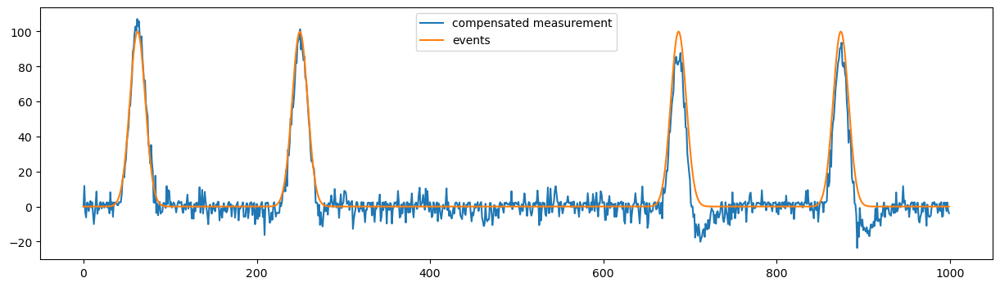

event_to_trend_amplitude: 0.5 , event_length_to_trend_period: 0.4 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.017670159620269063, 'q_process_noise_0': 0.7594521789553571, 'loc': 1.5864450560368752}
mse: 79.52592307269505


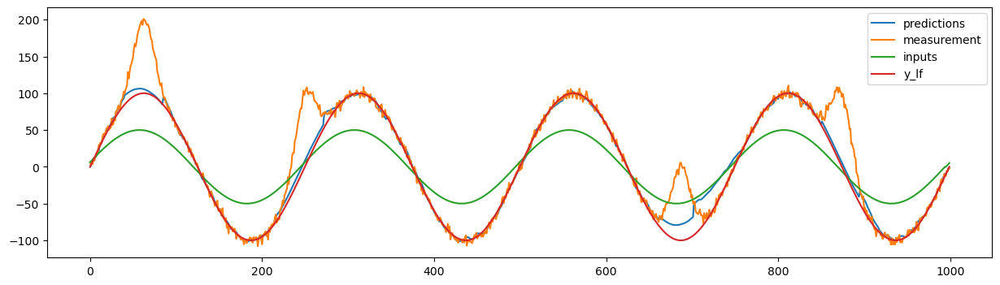

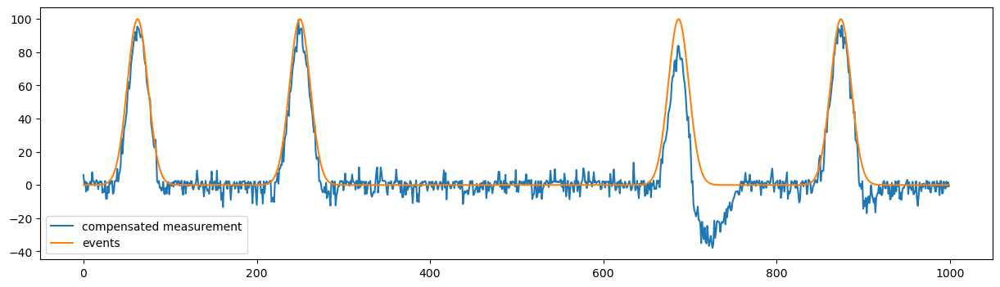

event_to_trend_amplitude: 0.5 , event_length_to_trend_period: 0.5 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.0017719818281381956, 'q_process_noise_0': 0.9977416999736194, 'loc': 1.6328709571343447}
mse: 88.93064978860046


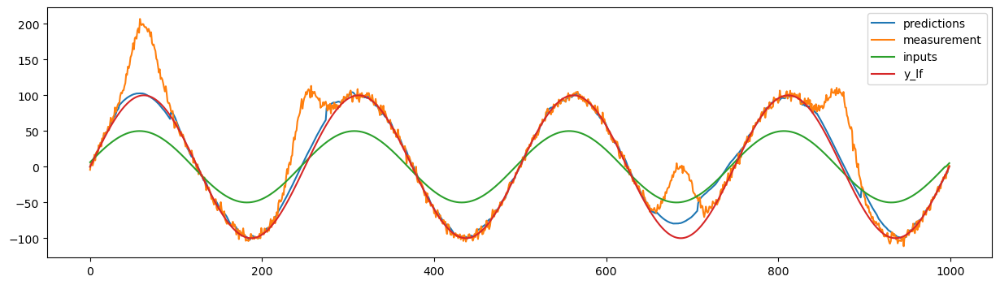

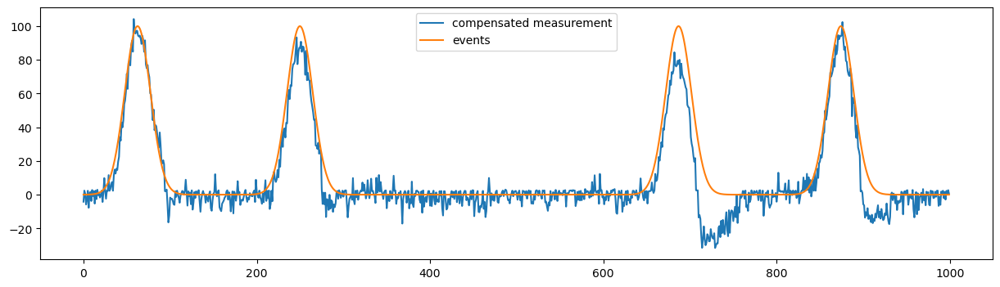

event_to_trend_amplitude: 0.6 , event_length_to_trend_period: 0.1 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.021676337111816366, 'q_process_noise_0': 0.5815286748462102, 'loc': 0.04085591136157783}
mse: 7.698365848589405


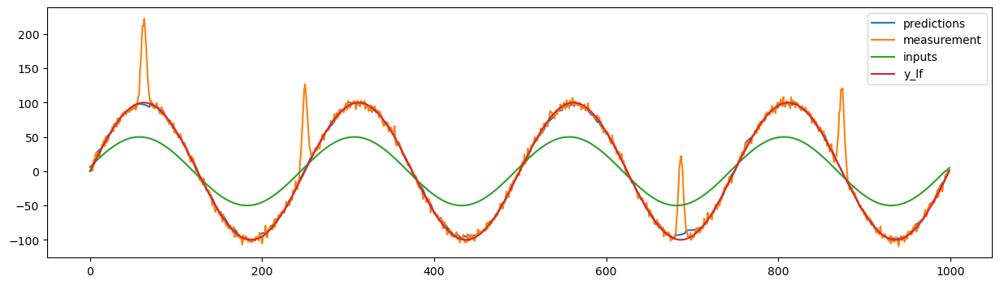

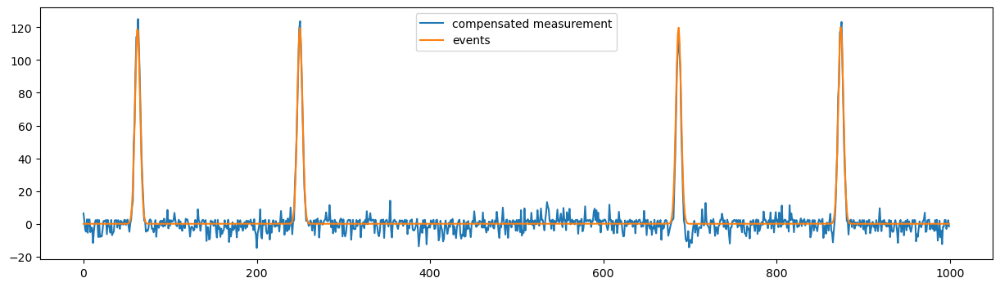

event_to_trend_amplitude: 0.6 , event_length_to_trend_period: 0.2 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.020140236035169533, 'q_process_noise_0': 0.7332693416221474, 'loc': 0.005440682500432256}
mse: 14.485088178394689


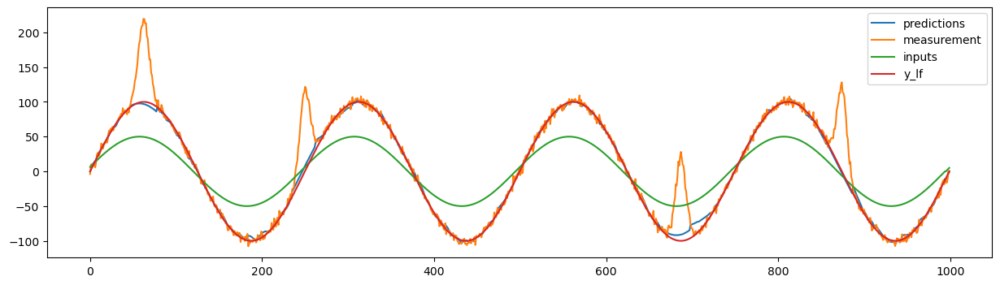

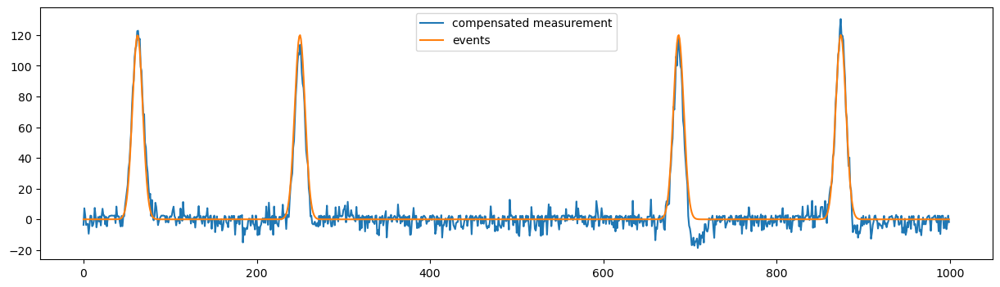

event_to_trend_amplitude: 0.6 , event_length_to_trend_period: 0.30000000000000004 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.6609098232724085, 'q_process_noise_0': 0.654582749683357, 'loc': 1.8529545776393876}
mse: 25.275306464890775


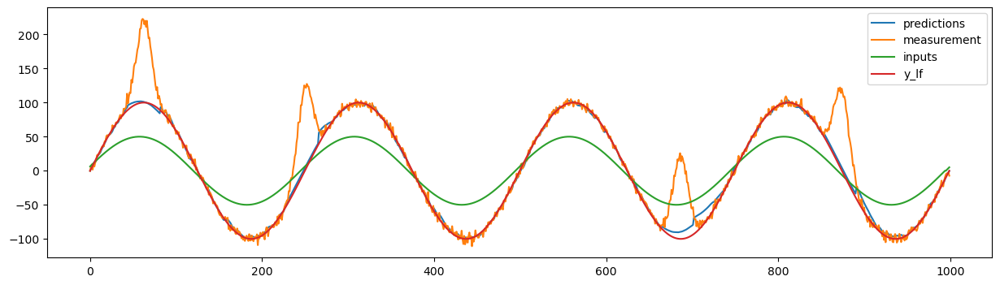

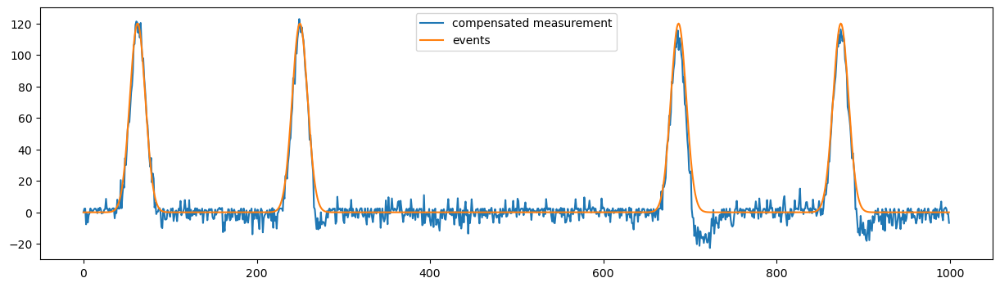

event_to_trend_amplitude: 0.6 , event_length_to_trend_period: 0.4 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.0016442367217679604, 'q_process_noise_0': 0.6206749280956743, 'loc': 0.4081274676988032}
mse: 60.5635674174504


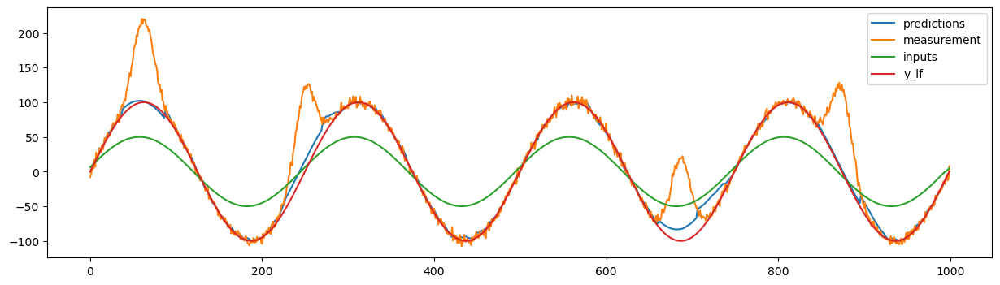

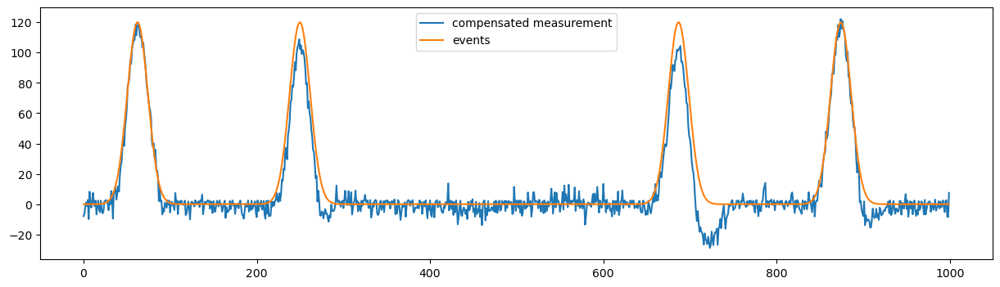

event_to_trend_amplitude: 0.6 , event_length_to_trend_period: 0.5 , time_shift: 0.005
optimal parameters: {'r_measurement_noise': 0.034185663038030376, 'q_process_noise_0': 0.7783850721872743, 'loc': 0.06049560436398943}
mse: 104.4291714597487


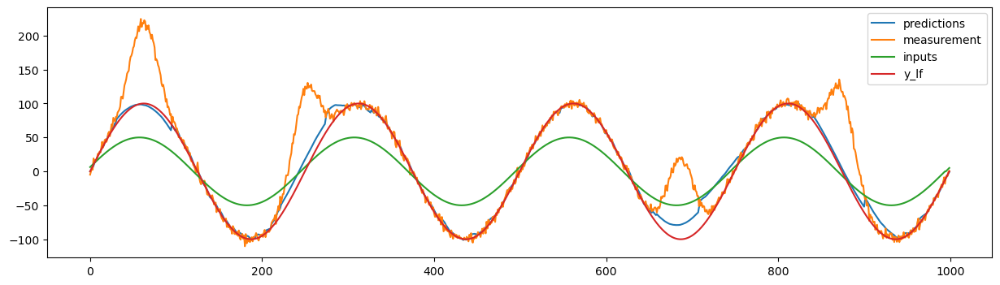

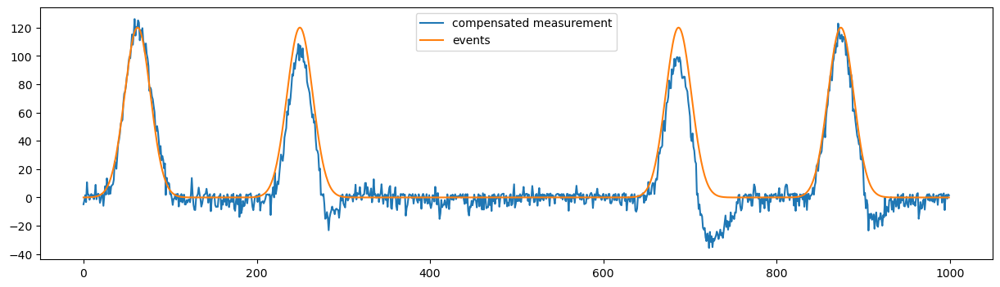

In [39]:
mses = []
for key in loaded_studies.keys():
    if key[0] >= min_allowed_event_to_trend_amplitude and key[1] <= max_allowed_event_length_to_trend_period and key[2] <= max_allowed_timeshift:
        print('event_to_trend_amplitude:', key[0], ', event_length_to_trend_period:', key[1], ', time_shift:', key[2])
        print('optimal parameters:', loaded_studies[key].best_trial.params)

        inputs = np.vstack([datasets[key]['input_'], np.insert(np.diff(datasets[key]['input_']),0,0)])
        measurement = datasets[key]['y_measurements']
        y_lf = datasets[key]['y_lf']

        pf_alpha = learn_alpha(inputs[0].reshape(-1, 1), measurement)
        # Suggest values for the hyperparameters
        num_particles = 1000 # best_params[key]['num_particles']
        r_measurement_noise = loaded_studies[list(loaded_studies.keys())[0]].best_trial.params['r_measurement_noise']
        q_process_noise_0 = loaded_studies[list(loaded_studies.keys())[0]].best_trial.params['q_process_noise_0']
        loc = loaded_studies[list(loaded_studies.keys())[0]].best_trial.params['loc']

        pf = ParticleFilter(
            num_particles=num_particles,
            r_measurement_noise=r_measurement_noise,
            q_process_noise=np.array([q_process_noise_0, 1]),
            loc=-loc,
            alpha=pf_alpha
        )
        predictions = pf.filter(measurement, inputs, loading=loading)
        mse = mean_squared_error(predictions, y_lf)
        mses.append(mse)
        print('mse:', mse)
        plt.figure(figsize=(15, 4))
        plt.plot(predictions, label='predictions')
        plt.plot(measurement, label='measurement')
        plt.plot(inputs[0], label='inputs')
        plt.plot(y_lf, label='y_lf')
        plt.legend()
        plt.show()
        plt.close()
        plt.figure(figsize=(15, 4))
        plt.plot(measurement-predictions, label='compensated measurement')
        plt.plot(datasets[key]['y_events'], label='events')
        plt.legend()
        plt.show()
        plt.close()

In [40]:
parameters['mse_first_settings'] = mses

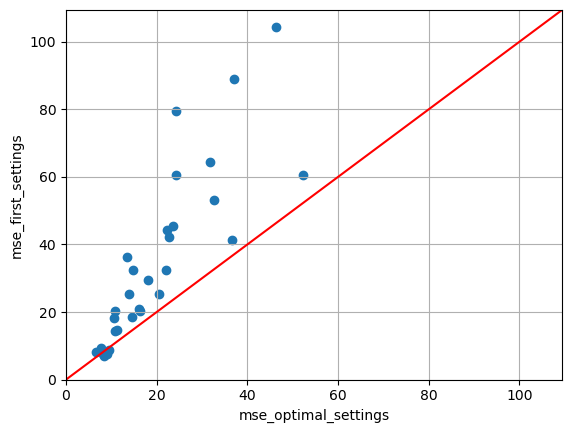

In [41]:
plt.scatter(parameters['mse'], parameters['mse_first_settings'])
plt.xlabel('mse_optimal_settings')
plt.ylabel('mse_first_settings')
plt.grid()
plt.xlim(0, max(parameters['mse_first_settings'])+5)
plt.ylim(0, max(parameters['mse_first_settings'])+5)
x = np.linspace(0, max(parameters['mse_first_settings'])+5, 100)
plt.plot(x, x, color='red')

In [42]:
# MSE of first row isn't the same, randomness in the PF output!
# Solution: run the PF multiple times and take the average of the mse during optimization

In [43]:
parameters

,event_to_trend_amplitude,event_length_to_trend_period,time_shift,r_measurement_noise,q_process_noise_0,loc,mse,mse_first_settings
0,0.1,0.1,0.005,2.094573,0.617498,3.354263,6.680636,8.119539
1,0.1,0.2,0.005,0.010178,0.919818,0.507722,10.768671,20.170197
2,0.1,0.3,0.005,0.001389,0.526627,0.704309,18.146204,29.379859
3,0.1,0.4,0.005,0.002107,0.65223,0.395031,22.286671,44.213858
4,0.1,0.5,0.005,0.100403,0.589511,2.265565,22.643588,42.241577
5,0.2,0.1,0.005,0.050798,0.812841,0.001623,9.086642,7.632731
6,0.2,0.2,0.005,0.112867,0.769188,1.461694,10.55454,18.130656
7,0.2,0.3,0.005,0.160214,0.758265,0.290359,20.42794,25.263352
8,0.2,0.4,0.005,0.47074,0.578158,1.874742,22.039827,32.528250
9,0.2,0.5,0.005,0.058737,0.761226,2.984378,31.686767,64.374128
